In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import itertools
import sys
import argparse
import json
import numbers
from collections.abc import Sequence
import logging
import warnings
from natsort import natsorted
import typing
from tqdm import tqdm
IMG_FOLDER = Path('/Users/sanjaykarinje/Downloads/usopen_2013_1.0/')

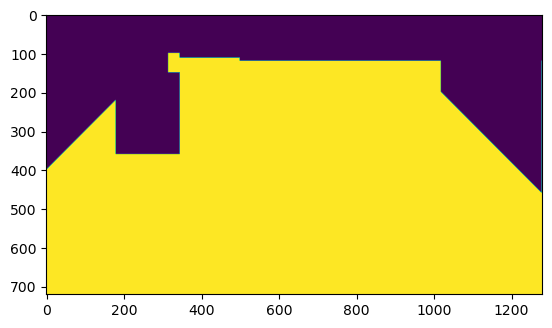

In [2]:
mask = np.ones((720,1280),dtype='uint8')
mask[100:360,180:345] = 0
mask[:112,:500] = 0
mask[:120,500:] = 0
mask[100:150,315:345] = 1
#mask[690:,:] = 0
for idx in range(400):
    mask[idx,range(400-idx)] = 0
for idx in range(260):
    mask[range(200+idx), 1279-260+idx] = 0
plt.imshow(mask)

In [3]:
# fig, ax = plt.subplots(1,1,figsize=(12,12))
# ax.imshow(plt.imread(f'/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_0900.jpg'))
# ax.imshow(mask, alpha=0.4)   

In [4]:
isinstance(np.nan, np.ndarray)

False

In [65]:
#helper functions
from collections import defaultdict

def configure_logging(debug):
    logging_level = logging.DEBUG if debug else logging.INFO

    logging.basicConfig(
        level=logging_level,
        format='%(asctime)s - %(name)s - %(funcName)s - %(levelname)s - %(message)s'
    )

def reset_logging():
    logging.shutdown()
    for handler in logging.root.handlers[:]:
        logging.root.removeHandler(handler)


def not_nan(value):
    if isinstance(value, (list,np.ndarray)): return not np.isnan(value).any()
    elif isinstance(value, numbers.Number): return not np.isnan(value)
    else: return True

def check_nan(value):
    return not not_nan(value)


def save_df_to_csv(df, filename):
    df_copy = df.copy()
    ndarr_cols = []
    for col in df_copy.columns:
        logging.debug(f'processing col: {col}')
        if isinstance(df_copy[col].iloc[0], np.ndarray):
            ndarr_cols.append(col)
            df_copy[col] = df_copy[col].map(lambda x: x.tolist() if not pd.isna(x).all() else x)
    df_copy.to_csv(filename, index=True)
    del df_copy
    return ndarr_cols

def read_df_from_csv(filename, index_col=0, ndarr_cols=None):
    df = pd.read_csv(filename, index_col=index_col)
    for col in ndarr_cols:
        logging.debug(f'processing col: {col}')
        df[col] = df[col].map(lambda x: np.array(eval(x)) if not_nan(x) else x)
    return df

def apply_df_overrides(override_file, df):
    with open(override_file, 'r') as file:
        for line in file:
            line = line.strip()
            line = line.split('=')
            df.loc[eval(line[0])] = eval(line[1])

def apply_dict_overrides(override_file, input_dict):
    with open(override_file, 'r') as file:
        for line in file:
            line = line.strip()
            line = line.split('=')
            input_dict[eval(line[0])] = eval(line[1])

def replace_df_index_prefix(df, new_prefix):
    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=FutureWarning)
        cur_prefix = Path(df.iloc[0].name).parent.as_posix()
        print(f'Replacing index {cur_prefix}:{new_prefix}')
        df.index = df.index.str.replace(cur_prefix, new_prefix)
    
def filter_clip(df, clip_num, clip_end_offset=None):
        clip_offset = 0 if not clip_end_offset else clip_end_offset
        return df.loc[(df.clip_num==clip_num)|(df.clip_num.shift(clip_offset)==clip_num)]

def get_clip_nums(df):
    return df.clip_num.value_counts().sort_index().index.values

def offset_fname(f, offset, prefix='img_', suffix='.jpg'):
  img_num = int(f.replace(prefix,'').replace(suffix,''))+offset
  img_f = prefix+str(img_num).zfill(4)+suffix
  return img_f

def foffset_fname(df, f, offset=15):
    return df.iloc[df.index.get_loc(f)+offset].name

def fname2int(f, offset=0, prefix='img_', suffix='.jpg'):
    return int(f.replace(prefix,'').replace(suffix,''))+offset


def argmin(iterable, key=None):
    if key is None:
        key = lambda x: x
    min_val, min_idx = min((key(x), i) for i, x in enumerate(iterable))
    return min_idx, min_val

def argmax(iterable, key=None):
    if key is None:
        key = lambda x: x
    max_val, max_idx = max((key(x), i) for i, x in enumerate(iterable))
    return max_idx, max_val

def r2_dist(a,b,axis=1,nan_shape=(2,2)):
    if not isinstance(a, np.ndarray): a = np.array(a)
    if not isinstance(b, np.ndarray): b = np.array(b)    
    
    if np.isnan(a).any() or np.isnan(b).any(): 
        return np.full(nan_shape, np.nan)
    return np.sqrt(np.sum((a-b)**2, axis=axis))

def apply_func_all_clips(df, func, clip_end_offset=None):
    clip2dict = defaultdict(list)
    for clip_num in get_clip_nums(df): 
        clip_df = filter_clip(df, clip_num, clip_end_offset=clip_end_offset)
        logging.info(f'processing clip: {clip_num} shape: {clip_df.shape}')
        clip2dict[clip_num] = func(clip_df)
    return clip2dict

def calc_delta_per_frame_backward(df, column_name):
        prev_value = np.nan
        result = pd.Series(index=df.index)
        for f, row in df.iterrows():
            current_value = row[column_name]
            i = df.index.get_loc(f)
            for j in reversed(range(max(i-11,0), max(0,i))):
                prev_value = df.iloc[j][column_name]
                if not_nan(prev_value):
                    break
            if not_nan(prev_value):
                n_frames = fname2int(f) - fname2int(df.iloc[j].name)
                if isinstance(current_value, (int, float)) and isinstance(prev_value, (int, float)):
                      result.iloc[i] = (prev_value-current_value)/max((j - i),n_frames)
                else:
                    result.iloc[i] = r2_dist(current_value,prev_value, axis=0, nan_shape=(1,1))/max((j - i),n_frames)
            else:
                result.iloc[i] = np.nan
        return result 


def calc_delta_per_frame(df, column_name):
    result = pd.Series(index=df.index)
    for f, row in df.iterrows():
        current_value = row[column_name]
        i = df.index.get_loc(f)
        if i > len(df)-10:
            result.iloc[i] = np.nan
            continue 
        for j in range(i+1, i+11):
            if j<len(df): next_value = df.iloc[j][column_name]
            if not_nan(next_value):
                break
        if not_nan(next_value):
            n_frames = fname2int(df.iloc[j].name) - fname2int(f)
            if isinstance(current_value, (int, float)) and isinstance(next_value, (int, float)):
                 #if f=='img_25012.jpg': print(f'f {f} {df.iloc[j].name} j-i {(j - i)} n_frames {n_frames} {(next_value-current_value)/max((j - i),n_frames)}')
                 result.iloc[i] = (next_value-current_value)/max((j - i),n_frames)
            else:
                result.iloc[i] = r2_dist(current_value,next_value, axis=0, nan_shape=(1,1))/max((j - i),n_frames)
    return result 

In [8]:
a = np.array([2,2,1])
b = np.array([1,2,3])
assert r2_dist(a,b,axis=0)==np.sqrt(5)

a = np.array([[2,2],[5,2]])
b = np.array([[2,1],[4,2]])
assert np.array_equal(r2_dist(a,b,axis=1),np.array([1.,1.]))

a = np.array([[2,2],[np.nan,2]])
b = np.array([[2,1],[4,2]])
#r2_dist(a,b,axis=0), np.full((2,2),np.nan)

In [9]:
def load_ball_data(file_path, local_img_folder=None):
    ball_df = pd.read_csv(file_path, index_col=0)
    ball_df.drop(['gt_x', 'gt_y', 'r2'], axis=1, inplace=True)
    ball_df.loc[(ball_df.pred_x<=5)|(ball_df.pred_y<=5),['pred_x','pred_y']] = np.nan
    ball_df['org_x'], ball_df['org_y'] = ball_df['pred_x'], ball_df['pred_y']
    ball_df = ball_df.rename(columns={'pred_x': 'x', 'pred_y': 'y'})
    ball_prefix = Path(ball_df.iloc[0].name).parent.as_posix()
    if local_img_folder: replace_df_index_prefix(ball_df, local_img_folder)
    return ball_df

In [10]:
def load_bbox_data(file_path):
    def numpy_decoder(obj):
        if isinstance(obj, list):
            try: return np.array(obj)
            except ValueError: pass
        return obj
    with open(file_path, 'r') as file:
        return json.loads(file.read(), object_hook=numpy_decoder)

In [20]:
def preprocess_bbox_data(bbox_data1, bbox_data2=None, local_img_folder=None):
    if bbox_data2: bbox_data1.update(bbox_data2)
    bbox_data = {}
    bbox_prefix =  Path(list(bbox_data1.keys())[0]).parent.as_posix()
    logging.debug(f'Replacing {bbox_prefix}:{local_img_folder}')
    for k, v in bbox_data1.items():
        if local_img_folder: k = k.replace(bbox_prefix, local_img_folder)
        bbox_data[k] = v
    return bbox_data

In [12]:
def load_court_data(file_path, local_img_folder=None):
    kp_df = pd.read_csv(file_path, index_col=0)
    kp_df['kp'] = kp_df['kp'].apply(lambda x: np.array(eval(x[1:-1])))
    kp_df['hm'] = kp_df['hm'].apply(lambda x: np.array(eval(x[1:-1])))
    if local_img_folder: replace_df_index_prefix(kp_df, local_img_folder)
    return kp_df

In [13]:
def merge_dataframes(kp_df, ball_df, bbox_data):
    ball_kp_df = kp_df.join(ball_df)
    ball_kp_df['bbox_data'] = ball_kp_df.index.map(bbox_data)
    return ball_kp_df

In [14]:
def process_data(data_args):
    reset_logging()
    configure_logging(data_args.debug)
    ball_df = load_ball_data(data_args.ball_file, data_args.local_img_folder)
    kp_df = load_court_data(data_args.court_file, data_args.local_img_folder)
    bbox_data1 = load_bbox_data(data_args.bbox_file1)
    bbox_data2 = load_bbox_data(data_args.bbox_file2) if data_args.bbox_file2 else None
    bbox_data = preprocess_bbox_data(bbox_data1, bbox_data2, data_args.local_img_folder)
    logging.debug(f'total frames in bbox_data: {len(bbox_data1)} {len(bbox_data2)} {len(bbox_data)}')
    assert Path(list(bbox_data.keys())[0]).parent.as_posix() == Path(ball_df.iloc[0].name).parent.as_posix() == Path(kp_df.iloc[0].name).parent.as_posix()
    df = merge_dataframes(kp_df, ball_df, bbox_data)
    df.index = df.index.map(lambda x: Path(x).name)
    ndarr_cols = save_df_to_csv(df,data_args.output_file)
    print(f"Preprocessed data saved to {data_args.output_file}")
    return df

In [15]:
#sample input data
bbox_file1 = '/Users/sanjaykarinje/Downloads/20k_usopen_2013_1_processed_res.json'
bbox_file2 = '/Users/sanjaykarinje/Downloads/usopen_2013_1_processed_res.json'
ball_file =  '/Users/sanjaykarinje/Downloads/test_usopen_2013_1.0_valid_imgs.txt_set_results.csv'
court_file = '/Users/sanjaykarinje/Downloads/usopen_2013_1_processed.csv'
output_file = '/Users/sanjaykarinje/Downloads/tmp_data_processed.csv'
local_img_folder = '/Users/sanjaykarinje/Downloads/usopen_2013_1.0'
sys.argv = ['notebook', '--bbox_file1', bbox_file1, '--bbox_file2', bbox_file2,\
           '--ball_file', ball_file, '--court_file', court_file, '--output_file', output_file, \
           '--local_img_folder', local_img_folder, '--debug']

In [21]:
data_parser = argparse.ArgumentParser(description="Preprocess tennis match data")
data_parser.add_argument("--bbox_file1", required=True, help="Path to first bbox data file")
data_parser.add_argument("--bbox_file2", help="Path to second bbox data file (optional)")
data_parser.add_argument("--ball_file", required=True, help="Path to ball data CSV file")
data_parser.add_argument("--court_file", required=True, help="Path to court data CSV file")
data_parser.add_argument("--output_file", required=True, help="Path to save preprocessed data")
data_parser.add_argument("--local_img_folder", required=True, help="Path to folder with image files")
data_parser.add_argument('--debug', action='store_true', help='Enable debug logging')
data_args = data_parser.parse_args()

df = process_data(data_args)

Replacing index /home/ubuntu/test-storage/Users/sanjaykarinje/Downloads/match_frames_v2/usopen_2013_1.0:/Users/sanjaykarinje/Downloads/usopen_2013_1.0
Replacing index /home/ubuntu/test-storage/Users/sanjaykarinje/Downloads/match_frames_v2/usopen_2013_1.0:/Users/sanjaykarinje/Downloads/usopen_2013_1.0


2024-07-24 09:57:10,146 - root - preprocess_bbox_data - DEBUG - Replacing /home/ubuntu/test-storage/Users/sanjaykarinje/Downloads/match_frames_v2/usopen_2013_1.0:/Users/sanjaykarinje/Downloads/usopen_2013_1.0
2024-07-24 09:57:10,165 - root - process_data - DEBUG - total frames in bbox_data: 54395 34395 54395
2024-07-24 09:57:10,306 - root - save_df_to_csv - DEBUG - processing col: kp
2024-07-24 09:57:11,004 - root - save_df_to_csv - DEBUG - processing col: valid
2024-07-24 09:57:11,004 - root - save_df_to_csv - DEBUG - processing col: hm
2024-07-24 09:57:11,692 - root - save_df_to_csv - DEBUG - processing col: clip_num
2024-07-24 09:57:11,693 - root - save_df_to_csv - DEBUG - processing col: x
2024-07-24 09:57:11,693 - root - save_df_to_csv - DEBUG - processing col: y
2024-07-24 09:57:11,693 - root - save_df_to_csv - DEBUG - processing col: org_x
2024-07-24 09:57:11,693 - root - save_df_to_csv - DEBUG - processing col: org_y
2024-07-24 09:57:11,693 - root - save_df_to_csv - DEBUG - pro

Preprocessed data saved to /Users/sanjaykarinje/Downloads/tmp_data_processed.csv


In [35]:
def fix_outliers(df):
    all_rows = []
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        df.loc[df.x.isna()|df.y.isna(), ['x','y']] = np.nan
        df['x_dp'] = calc_delta_per_frame_backward(df, 'x')
        df['y_dp'] = calc_delta_per_frame_backward(df, 'y')
        df['x_df'] = abs(calc_delta_per_frame(df, 'x'))
        df['y_df'] = abs(calc_delta_per_frame(df, 'y'))
    
        na_cond = ((df['x_dp'].fillna(50)>=20) & (df['x_df']>=20)) | ((df['x_dp']>=20) & (df['x_df'].fillna(50)>=20)) | \
                  ((df['y_dp'].fillna(50)>=30) & (df['y_df']>=30)) | ((df['y_dp']>=30) & (df['y_df'].fillna(50)>=30))
        
        df.loc[na_cond,['x','y']] = np.nan
        df['x_dp'] = calc_delta_per_frame_backward(df, 'x')
        df['y_dp'] = calc_delta_per_frame_backward(df, 'y')
        df['x_df'] = abs(calc_delta_per_frame(df, 'x'))
        df['y_df'] = abs(calc_delta_per_frame(df, 'y'))

    prev_flag = False
    for idx, row in df.iterrows():
        if (abs(row.x_dp)>=20 or abs(row.y_dp)>=30):
            if not prev_flag:
                row['flag'] = True
                prev_flag = True
                count = 1
            else:
                row['flag'] = False
                prev_flag = False
        else:
            if prev_flag and (np.isnan((row.x,row.y)).any() or count>3):
                row['flag'] = False
                prev_flag = False
                count = 0
            elif prev_flag:
                row['flag'] = True
                prev_flag = True
                count += 1
            else:
                row['flag'] = False
                prev_flag = False
        all_rows.append(row)
    out_df = pd.DataFrame(all_rows)
    out_df.loc[out_df.flag==True, ['x','y']] = np.nan
    return out_df

In [36]:
override_file = '/Users/sanjaykarinje/ball_tracking_3d/usopen_2013_1.0_override.csv'
input_file = data_args.output_file
sys.argv = ['notebook', '--input_file', input_file, '--override_file', override_file]
clean_parser = argparse.ArgumentParser(description="Clean ball location data")
clean_parser.add_argument("--override_file", required=True, help="Path to ball location override file")
clean_parser.add_argument("--input_file", required=True, help="Path to merged data file")
clean_args = clean_parser.parse_args()
clean_args.override_file, clean_args.input_file

('/Users/sanjaykarinje/ball_tracking_3d/usopen_2013_1.0_override.csv',
 '/Users/sanjaykarinje/Downloads/tmp_data_processed.csv')

In [37]:
ndarr_cols =  ['kp','hm','bbox_data']
df = read_df_from_csv(clean_args.input_file, ndarr_cols=ndarr_cols)
df.sample(3)

,kp,valid,hm,clip_num,x,y,org_x,org_y,bbox_data
img_36365.jpg,"[[[483.21533636169005, 194.09671375489876]], [...",True,"[[0.8223382867902976, -0.0018229209645990033, ...",70,NaN,NaN,NaN,NaN,"[{'bbox': [754.0145263671875, 125.985679626464..."
img_7185.jpg,"[[[443.52804740792305, 170.13399775648742]], [...",True,"[[0.999865302664721, -0.002819550091675253, 8....",6,354.0,109.0,354.0,109.0,"[{'bbox': [692.412109375, 488.90673828125, 783..."
img_69566.jpg,"[[[441.77561849957675, 179.77372034264368]], [...",True,"[[0.9529536859872999, 0.0002900332185315841, 2...",110,300.0,85.0,300.0,85.0,"[{'bbox': [957.7567138671875, 558.997985839843..."


In [38]:
apply_df_overrides(clean_args.override_file, df)

clean_df = pd.DataFrame([])
for clip_num in sorted(df.clip_num.value_counts().index.values):
    clip_df = fix_outliers(fix_outliers(filter_clip(df, clip_num)))
    clean_df = pd.concat([clean_df,clip_df], axis=0)
print(df.shape, clean_df.shape)

(54395, 9) (54395, 14)


In [39]:
import cv2
import numpy as np
from operator import itemgetter

p1_player = np.array([[160, 100, 100],[180, 255, 255]]) #red mask
p2_player = np.array([[  0,   0,  50],[180,  30, 200]]) #gray mask
  
def box_area(b):
    x1,y1,x2,y2,_= b
    return int(abs(x2-x1)*abs(y2-y1))
 
def get_player_color(img_path, img_bbox):
    image = cv2.imread(img_path)
    (x1, y1, x2, y2,_) = map(int,img_bbox)
    roi = image[max(y1,0):y2, max(x1,0):x2]
    hsv = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
    p1_mask = cv2.inRange(hsv, p1_player[0], p1_player[1])
    p2_mask = cv2.inRange(hsv, p2_player[0], p2_player[1])
    p1_percentage = int(cv2.countNonZero(p1_mask) / (roi.shape[0] * roi.shape[1]) * 100)
    p2_percentage = int(cv2.countNonZero(p2_mask) / (roi.shape[0] * roi.shape[1]) * 100)
    box_c = 'red' if p1_percentage > 0 else 'gray' 
    return box_c  

def select_player_box(bboxes, kps, prev_bb, player_side='n'):
    if len(bboxes)==0: return np.array([np.nan]), np.array([np.nan])
    if len(bboxes)==1: return bboxes[0], kps[0]
    box_c_idx = np.argmin(bboxes[:,3]) if player_side=='n' else np.argmax(bboxes[:,3])
    if np.isnan(prev_bb).any(): return bboxes[box_c_idx], kps[box_c_idx]
    box_pp_idx = np.argmin([r2_dist(bbox[2:4],prev_bb[2:4],axis=0, nan_shape=(1,1)) for bbox in bboxes])
    return bboxes[box_pp_idx], kps[box_pp_idx]

In [40]:
from tqdm import tqdm
import cProfile, pstats

def extract_player_bbox_kps(df):
    results = []
    prev_n_bb, prev_f_bb = [np.nan], [np.nan]
    get_box, get_kp = itemgetter('bbox'), itemgetter('keypoints')
    for idx, (f, row) in tqdm(enumerate(df.iterrows()), total=len(df), desc="Adding player attribs"):
        img_path = str(Path(data_args.local_img_folder)/f)
        player_boxes = np.array([get_box(item) for item in row.bbox_data])
        player_kps = np.array([get_kp(item) for item in row.bbox_data])
        if player_boxes.shape[0]==0 or max([box_area(box) for box in player_boxes]) > 20000: continue 
        court_center = row.kp.squeeze()[12:14].mean(axis=0)
        player_f = np.array([True if item[3]<court_center[1] else False for item in player_boxes])
        row['n_bb'], row['n_kp'] = select_player_box(player_boxes[~player_f], player_kps[~player_f], prev_n_bb, 'n')
        row['f_bb'], row['f_kp'] = select_player_box(player_boxes[player_f], player_kps[player_f], prev_f_bb, 'f')
        prev_n_bb, prev_f_bb = row['n_bb'], row['f_bb']
        row['n_p'] = get_player_color(img_path, row['n_bb']) if not np.isnan(row['n_bb']).any() else np.nan
        row['f_p'] = get_player_color(img_path, row['f_bb']) if not np.isnan(row['f_bb']).any() else np.nan
        results.append(row)
    results_df = pd.DataFrame(results)
    for clip_num in results_df.clip_num.value_counts().index: #make players side consistent across clip
        clip_df = results_df[results_df.clip_num==clip_num]
        players, counts = np.unique(clip_df['n_p'].fillna('na'), return_counts=True)
        results_df.loc[results_df.clip_num==clip_num, 'n_p'] = players[np.argmax(counts)]
        players, counts = np.unique(clip_df['f_p'].fillna('na'), return_counts=True)
        results_df.loc[results_df.clip_num==clip_num, 'f_p'] = players[np.argmax(counts)]
    return results_df

In [41]:

def estimate_heel_bottom(knee_xy, ankle_xy, extrapolation_factor=1.7):
  knee_point = np.array(knee_xy)
  ankle_point = np.array(ankle_xy)
  if np.isnan(knee_point).any() or np.isnan(ankle_point).any():
      return np.array([np.nan]*4).reshape(2,2)
 
  leg_vector = ankle_point - knee_point
  heel_point = knee_point + leg_vector * extrapolation_factor

  return heel_point

def add_player_attribs(df):
    df['n_hs'] =  df['n_kp'].map(lambda x: np.array(x)[9:11][:,:2] if not np.isnan(x).any() else np.array([np.nan]))
    df['f_hs'] =  df['f_kp'].map(lambda x: np.array(x)[9:11][:,:2] if not np.isnan(x).any() else np.array([np.nan]))
    df['n_ls'] =  df['n_kp'].map(lambda x: np.array(x)[15:17][:,:2] if not np.isnan(x).any() else np.array([np.nan]))
    df['f_ls'] =  df['f_kp'].map(lambda x: np.array(x)[15:17][:,:2] if not np.isnan(x).any() else np.array([np.nan]))
    df['n_bs']  = df['n_kp'].map(lambda x: np.array(x)[:4][:,:2] if not np.isnan(x).any() else np.array([np.nan]))
    df['f_bs']  = df['f_kp'].map(lambda x: np.array(x)[:4][:,:2] if not np.isnan(x).any() else np.array([np.nan]))
    df['n_bdist'] =  df.apply(lambda row: r2_dist(np.array([row['x'],row['y']])*2,row['n_hs'], axis=1, nan_shape=(2,1))[1 if row.n_p=='red' else 0], axis=1)
    df['n_bdist'] = df['n_bdist'].map(lambda x: x.item() if isinstance(x, np.ndarray) else x)
    df['f_bdist'] =  df.apply(lambda row: r2_dist(np.array([row['x'],row['y']])*2,row['f_hs'], axis=1, nan_shape=(2,1))[1 if row.f_p=='red' else 0], axis=1)
    df['f_bdist'] = df['f_bdist'].map(lambda x: x.item() if isinstance(x, np.ndarray) else x)
    df['n_knees'] =  df.apply(lambda row: row.n_kp[13:15,:2] if not np.isnan(row.n_kp).any() else np.array([np.nan]), axis=1)
    df['n_ankles'] = df.apply(lambda row: row.n_kp[15:17,:2] if not np.isnan(row.n_kp).any() else np.array([np.nan]), axis=1)
    df['f_knees'] =  df.apply(lambda row: row.f_kp[13:15,:2] if not np.isnan(row.f_kp).any() else np.array([np.nan]), axis=1)
    df['f_ankles'] = df.apply(lambda row: row.f_kp[15:17,:2] if not np.isnan(row.f_kp).any() else np.array([np.nan]), axis=1)
    df['n_heels'] =  df.apply(lambda row: estimate_heel_bottom(row.n_knees, row.n_ankles), axis=1)
    df['f_heels'] =  df.apply(lambda row: estimate_heel_bottom(row.f_knees, row.f_ankles, extrapolation_factor=1.2), axis=1)

    df['n_l'] = df['n_kp'].map(lambda x: np.array(x)[15:17][:,:2].mean(axis=0) if not np.isnan(x).any() else np.array([np.nan]))
    df['f_l'] = df['f_kp'].map(lambda x: np.array(x)[15:17][:,:2].mean(axis=0) if not np.isnan(x).any() else np.array([np.nan]))
    df['n_l_t1'] = df['n_l'].shift(1)
    df['f_l_t1'] = df['f_l'].shift(1)
    df['n_l_d'] = ((df['n_l_t1'] - df['n_l'])**2).map(lambda x: np.sqrt(np.sum(x)))
    df['f_l_d'] = ((df['f_l_t1'] - df['f_l'])**2).map(lambda x: np.sqrt(np.sum(x)))
    df['n_l_d'] = np.where(df['clip_num']!=df['clip_num'].shift(1), np.nan, df['n_l_d'])
    df['f_l_d'] = np.where(df['clip_num']!=df['clip_num'].shift(1), np.nan, df['f_l_d'])
    df['n_b'] = df['n_kp'].map(lambda x: np.array(x)[:4].mean(axis=0)[:2] if not np.isnan(x).any() else np.array([np.nan]))
    df['f_b'] = df['f_kp'].map(lambda x: np.array(x)[:4].mean(axis=0)[:2] if not np.isnan(x).any() else np.array([np.nan]))
   
    df['vec_x1'] = df['x'] - df['x'].shift(1)
    df['vec_y1'] = df['y'] - df['y'].shift(1)
    df['vec_mod'] = np.sqrt(df['vec_x1']**2+df['vec_y1']**2)
    df['vec_mod'] = df['vec_mod'].shift(-1).fillna(method='bfill')
    df['vec_mod_delta'] = df['vec_mod'] - df['vec_mod'].shift(1) 
    return df

In [42]:
#add attributes required for serve
def add_serve_attribs(df):
    results = []
    for f, row in df.iterrows():
        hraised, hraised_side, ball_c, bdist, h_idx, lcdist = False, np.nan, np.array([0,0]), None, None, None
        for idx, kp in enumerate([row.n_kp, row.f_kp]):
            if not not_nan(kp): continue
            if not_nan([row.x, row.y]): ball_c = np.array([row.x*2, row.y*2])
            try: 
                head_y, hand_y, leg_y = max(kp[1:3][:,1]), min(kp[9:11][:,1]), np.mean(kp[15:16][:,1])
                dist = min(r2_dist(kp[1:3][:,:2], ball_c))
            except:
                print(f,kp,type(kp),ball_c,np.isnan(ball_c).any(),r2_dist(kp[1:3][:,:2], ball_c))
            if hand_y <= head_y and dist is not None and dist<200: 
                hraised = True
                bdist=dist
                h_idx = idx
                lcdist = None
                hraised_side = 'F' if leg_y<300 else 'N' if leg_y>=300 else np.nan
                if not (row.kp==None).any(): 
                    lcdist = r2_dist(row.kp.squeeze()[[2,3,5,7]].mean(axis=0), row.n_ls.mean(axis=0), axis=0, nan_shape=(1,1)) if idx==0 else r2_dist(row.kp.squeeze()[[0,1,4,6]].mean(axis=0), row.f_ls.mean(axis=0), axis=0)
        row['hraised'] = hraised
        row['hraised_side'] = hraised_side
        row['hraised_bdist'] = bdist
        row['h_idx'] = h_idx
        row['lcdist'] = lcdist
        row['lcdist_inc'] = lcdist<45 if h_idx==1 else lcdist<100 if h_idx==0 else None
        results.append(row)
    df = pd.DataFrame(results)
    return df

In [117]:
results_df = extract_player_bbox_kps(clean_df)
results_df = add_player_attribs(results_df)
results_df.shape

Adding player attribs: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54395/54395 [03:37<00:00, 250.17it/s]


(54343, 46)

In [118]:
results_df = add_serve_attribs(results_df)
results_df.shape

(54343, 52)

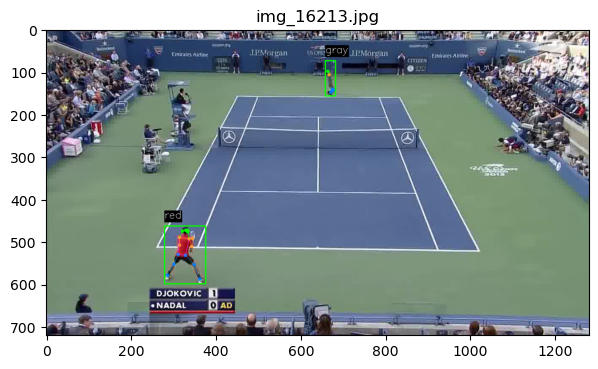

In [119]:
#visualization functions 

def imshow_keypoints(img, pose_result, skeleton=None, kpt_score_thr=0.3, pose_kpt_color=None,
                     pose_link_color=None, radius=4, thickness=1, show_keypoint_weight=False):
    img_h, img_w, _ = img.shape
    for kpts in pose_result:

        kpts = np.array(kpts, copy=False)

        # draw each point on image
        if pose_kpt_color is not None:
            assert len(pose_kpt_color) == len(kpts)
            for kid, kpt in enumerate(kpts):
                x_coord, y_coord, kpt_score = int(kpt[0]), int(kpt[1]), kpt[2]
                if kpt_score > kpt_score_thr:
                    color = tuple(int(c) for c in pose_kpt_color[kid])
                    if show_keypoint_weight:
                        img_copy = img.copy()
                        cv2.circle(img_copy, (int(x_coord), int(y_coord)),
                                   radius, color, -1)
                        transparency = max(0, min(1, kpt_score))
                        cv2.addWeighted(
                            img_copy,
                            transparency,
                            img,
                            1 - transparency,
                            0,
                            dst=img)
                    else:
                        cv2.circle(img, (int(x_coord), int(y_coord)), radius,
                                   color, -1)

        # draw links
        if skeleton is not None and pose_link_color is not None:
            assert len(pose_link_color) == len(skeleton)
            for sk_id, sk in enumerate(skeleton):
                pos1 = (int(kpts[sk[0], 0]), int(kpts[sk[0], 1]))
                pos2 = (int(kpts[sk[1], 0]), int(kpts[sk[1], 1]))
                if (pos1[0] > 0 and pos1[0] < img_w and pos1[1] > 0
                        and pos1[1] < img_h and pos2[0] > 0 and pos2[0] < img_w
                        and pos2[1] > 0 and pos2[1] < img_h
                        and kpts[sk[0], 2] > kpt_score_thr
                        and kpts[sk[1], 2] > kpt_score_thr):
                    color = tuple(int(c) for c in pose_link_color[sk_id])
                    if show_keypoint_weight:
                        img_copy = img.copy()
                        X = (pos1[0], pos2[0])
                        Y = (pos1[1], pos2[1])
                        mX = np.mean(X)
                        mY = np.mean(Y)
                        length = ((Y[0] - Y[1])**2 + (X[0] - X[1])**2)**0.5
                        angle = math.degrees(
                            math.atan2(Y[0] - Y[1], X[0] - X[1]))
                        stickwidth = 2
                        polygon = cv2.ellipse2Poly(
                            (int(mX), int(mY)),
                            (int(length / 2), int(stickwidth)), int(angle), 0,
                            360, 1)
                        cv2.fillConvexPoly(img_copy, polygon, color)
                        transparency = max(
                            0, min(1, 0.5 * (kpts[sk[0], 2] + kpts[sk[1], 2])))
                        cv2.addWeighted(
                            img_copy,
                            transparency,
                            img,
                            1 - transparency,
                            0,
                            dst=img)
                    else:
                        cv2.line(img, pos1, pos2, color, thickness=thickness)

    return img


def show_result(img, result, skeleton=None, kpt_score_thr=0.3, bbox_color=None, pose_kpt_color=None,
                    pose_link_color=None, radius=4, thickness=1, font_scale=0.5, win_name='',
                    show=False, show_keypoint_weight=False, wait_time=0, out_file=None):
    img = img.copy()
    img_h, img_w, _ = img.shape

    pose_result = [result]
    #for res in result:
    #    pose_result.append(res['keypoints'])
    
    imshow_keypoints(img, pose_result, skeleton, kpt_score_thr, pose_kpt_color, pose_link_color, radius, thickness)

    if show:
        cv2.imshow(img, win_name, wait_time)

    if out_file is not None:
        cv2.imwrite(out_file, img)

    return img


def vis_pose_result(img, pose_result, radius=4, thickness=1, kpt_score_thr=0.3, 
                    bbox_color='green', show=False, out_file=None):
                        
    palette = np.array([[255, 128, 0], [255, 153, 51], [255, 178, 102],
                            [230, 230, 0], [255, 153, 255], [153, 204, 255],
                            [255, 102, 255], [255, 51, 255], [102, 178, 255],
                            [51, 153, 255], [255, 153, 153], [255, 102, 102],
                            [255, 51, 51], [153, 255, 153], [102, 255, 102],
                            [51, 255, 51], [0, 255, 0], [0, 0, 255],
                            [255, 0, 0], [255, 255, 255]])

    skeleton = [[15, 13], [13, 11], [16, 14], [14, 12], [11, 12],
                        [5, 11], [6, 12], [5, 6], [5, 7], [6, 8], [7, 9],
                        [8, 10], [1, 2], [0, 1], [0, 2], [1, 3], [2, 4],
                        [3, 5], [4, 6]]

    pose_link_color = palette[[
                0, 0, 0, 0, 7, 7, 7, 9, 9, 9, 9, 9, 16, 16, 16, 16, 16, 16, 16
            ]]
    pose_kpt_color = palette[[
                16, 16, 16, 16, 16, 9, 9, 9, 9, 9, 9, 0, 0, 0, 0, 0, 0
            ]]

    
    img = show_result(img, pose_result, skeleton, radius=radius, thickness=thickness, pose_kpt_color=pose_kpt_color,
    pose_link_color=pose_link_color, kpt_score_thr=kpt_score_thr, bbox_color=bbox_color, show=show, out_file=out_file)
                        
    
    return img


def draw_bbox_with_label(image, bbox, kps=None, label_name=None):
    if np.isnan(bbox).any(): return image
    (x1, y1, x2, y2,_) = list(map(int,bbox))
    #print(x1,y1,x2,y2)
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    if label_name:
        text_size, _ = cv2.getTextSize(label_name, cv2.FONT_HERSHEY_SIMPLEX, 0.8, 1)
        label_x = x1
        label_y = y1 - text_size[1] if y1 - text_size[1] > 0 else y1 + text_size[1] + 2
        cv2.rectangle(image, (label_x, label_y - text_size[1]), (label_x + text_size[0], label_y + text_size[1] // 2), (0, 0, 0), -1)
        cv2.putText(image, label_name, (label_x, label_y), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 1)
    if kps is not None: 
        image = vis_pose_result(image, kps)
    return image

img_name = 'img_55604.jpg'
img_name = 'img_16213.jpg'
img_path = str(IMG_FOLDER/img_name)
img = cv2.imread(img_path)
img = draw_bbox_with_label(img, results_df.loc[img_name]['f_bb'], results_df.loc[img_name]['f_kp'], results_df.loc[img_name]['f_p'])
img = draw_bbox_with_label(img, results_df.loc[img_name]['n_bb'], results_df.loc[img_name]['n_kp'], results_df.loc[img_name]['n_p'])
plt.figure(figsize=(7,4))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
plt.title(img_name)
plt.show()

In [120]:
def clip_serve_fs(clip_df):
    prev_f_num = 0
    serve_fs = []
    clip_df.loc[:,'raised_cumm'] = clip_df['hraised'].rolling(20).sum().shift(-19)
    clip_df.loc[:,'vec_cumm'] = abs(clip_df['vec_x1']).rolling(10, min_periods=5).mean().shift(-9)
    clip_df.loc[:,'d_cumm'] = np.where(clip_df.h_idx==0, abs(clip_df['n_l_d']).rolling(10, min_periods=5).sum(), abs(clip_df['f_l_d']).rolling(10, min_periods=5).sum())
    clip_df.loc[:,'d_cumm'] = clip_df.loc[:,'d_cumm'].shift(2)
    clip_df.loc[:,'d_cumm'] = clip_df.loc[:,'d_cumm'].fillna(method='bfill')
    cond1 = (clip_df.vec_cumm<=1.5) 
    cond2 = (clip_df.raised_cumm>5) 
    cond3 = (clip_df.hraised==True) 
    cond4 = (clip_df.hraised_bdist<85) 
    cond5 = (clip_df.d_cumm<32) 
    cond6 = (clip_df.lcdist_inc==True)
    for f in clip_df[cond1 & cond2 & cond3 & cond4 & cond5 & cond6 ].index.values:
        f_num = fname2int(f)
        if f_num > prev_f_num+30: 
            serve_fs.append(f)
        prev_f_num = f_num
    return serve_fs

In [121]:
clip_df = filter_clip(results_df, 33)
clip_serve_fs(clip_df)
row = clip_df.loc['img_12820.jpg']
print(f' {row.vec_cumm} {row.raised_cumm} {row.hraised}')

 0.3 12.0 True


/var/folders/0p/wt4x3lmn6bsbg6rgw45f7d7r0000gn/T/ipykernel_3508/505281256.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clip_df.loc[:,'raised_cumm'] = clip_df['hraised'].rolling(20).sum().shift(-19)
/var/folders/0p/wt4x3lmn6bsbg6rgw45f7d7r0000gn/T/ipykernel_3508/505281256.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clip_df.loc[:,'vec_cumm'] = abs(clip_df['vec_x1']).rolling(10, min_periods=5).mean().shift(-9)
/var/folders/0p/wt4x3lmn6bsbg6rgw45f7d7r0000gn/T/ipykernel_3508/505281256.py:6: Settin

In [134]:
with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        serve_pts = apply_func_all_clips(results_df, clip_serve_fs)
        #serve_pts

INFO:root:processing clip: 0 shape: (466, 75)
INFO:root:processing clip: 1 shape: (621, 75)
INFO:root:processing clip: 2 shape: (733, 75)
INFO:root:processing clip: 3 shape: (615, 75)
INFO:root:processing clip: 4 shape: (569, 75)
INFO:root:processing clip: 5 shape: (355, 75)
INFO:root:processing clip: 6 shape: (546, 75)
INFO:root:processing clip: 7 shape: (809, 75)
INFO:root:processing clip: 8 shape: (351, 75)
INFO:root:processing clip: 32 shape: (1014, 75)
INFO:root:processing clip: 33 shape: (730, 75)
INFO:root:processing clip: 35 shape: (381, 75)
INFO:root:processing clip: 36 shape: (361, 75)
INFO:root:processing clip: 37 shape: (455, 75)
INFO:root:processing clip: 38 shape: (516, 75)
INFO:root:processing clip: 39 shape: (230, 75)
INFO:root:processing clip: 40 shape: (474, 75)
INFO:root:processing clip: 46 shape: (301, 75)
INFO:root:processing clip: 47 shape: (315, 75)
INFO:root:processing clip: 48 shape: (352, 75)
INFO:root:processing clip: 49 shape: (745, 75)
INFO:root:processing 

In [123]:
# serve_pts_old = json.load( open( "serve_pts_old.json" ) )
# for clip_num, pts in serve_pts_old.items():
#     print(f'clip:{clip_num} old:{pts} new{serve_pts.get(eval(clip_num))}')

In [124]:
from IPython.display import display, HTML

def clip_serve_fs_refined(serve_pts, clip_df):
    serve_refined_fs = []
    clip_num = clip_df.iloc[0].clip_num
    fs = serve_pts.get(clip_num)
    for f in fs:
        f_40 = offset_fname(f,40)
        tmp_df = clip_df.loc[f:f_40]
        cond1 = (tmp_df.vec_mod>=8.9) & (~tmp_df.x.isna())
        tmp_df = tmp_df[cond1]
        f_h, vec_mod, vec_mod_delta = tmp_df.index.values[0] if tmp_df.shape[0]>0 else None, \
                                      round(tmp_df.iloc[0]['vec_mod'],1) if tmp_df.shape[0]>0 else None, \
                                      round(tmp_df.iloc[0]['vec_mod_delta'],1) if tmp_df.shape[0]>0 else None
        f_p1, vec_mod_p1 = offset_fname(f_h,-1) if tmp_df.shape[0]>0 else None, \
                           round(clip_df.loc[offset_fname(f_h,-1)]['vec_mod'],1) if tmp_df.shape[0]>0 else None
        
        if vec_mod_p1 is not None and vec_mod_p1>=5.0: 
            f_h = f_p1
            vec_mod = vec_mod_p1
            vec_mod_p1 = round(results_df.loc[offset_fname(f_h,-1)]['vec_mod'],1) if tmp_df.shape[0]>0 else None

        if f_h is None: f_h = f
        serve_refined_fs.append(f_h) 
    return serve_refined_fs


In [125]:
from functools import partial
serve_hit_pts = apply_func_all_clips(results_df, partial(clip_serve_fs_refined, serve_pts))


2024-07-24 17:44:00,681 - root - apply_func_all_clips - INFO - processing clip: 0 shape: (466, 52)
2024-07-24 17:44:00,689 - root - apply_func_all_clips - INFO - processing clip: 1 shape: (621, 52)
2024-07-24 17:44:00,694 - root - apply_func_all_clips - INFO - processing clip: 2 shape: (733, 52)
2024-07-24 17:44:00,696 - root - apply_func_all_clips - INFO - processing clip: 3 shape: (615, 52)
2024-07-24 17:44:00,697 - root - apply_func_all_clips - INFO - processing clip: 4 shape: (569, 52)
2024-07-24 17:44:00,699 - root - apply_func_all_clips - INFO - processing clip: 5 shape: (355, 52)
2024-07-24 17:44:00,704 - root - apply_func_all_clips - INFO - processing clip: 6 shape: (546, 52)
2024-07-24 17:44:00,707 - root - apply_func_all_clips - INFO - processing clip: 7 shape: (809, 52)
2024-07-24 17:44:00,710 - root - apply_func_all_clips - INFO - processing clip: 8 shape: (351, 52)
2024-07-24 17:44:00,715 - root - apply_func_all_clips - INFO - processing clip: 32 shape: (1014, 52)
2024-07-

In [126]:
serve_hit_pts.get(105).pop(-1)
serve_hit_pts.get(140).pop(-1)
serve_hit_pts[35] = ['img_13881.jpg']
serve_hit_pts[193] = ['img_93635.jpg']


In [127]:
def hand2box_dist(bbox, hands):
    if np.isnan(hands).any() or np.isnan(bbox).any():
        return np.nan
    return r2_dist(bbox[:4].reshape(2,2).mean(axis=0),hands)

def calc_hs_dist_cumm(df, column_name):
    result = pd.DataFrame(index=df.index, columns=['A'])
    for f, row in df.iterrows():
        i = df.index.get_loc(f)
        row_slice = slice(max(0,i-10),min(len(df),i))
        result.iloc[i,0] = np.max(df[row_slice][column_name].mean(axis=0))
    return result 

def add_point_end_attribs(df):
    df['n_h2bb'] = df.apply(lambda row: hand2box_dist(row.n_bb, row.n_hs), axis=1)
    df['f_h2bb'] = df.apply(lambda row: hand2box_dist(row.f_bb, row.f_hs), axis=1)
    df['n_h2bb_delta'] = abs(df['n_h2bb'] - df['n_h2bb'].shift(1))
    df['f_h2bb_delta'] = abs(df['f_h2bb'] - df['f_h2bb'].shift(1))
    df['n_h2bb_cumm'] = calc_hs_dist_cumm(df, 'n_h2bb_delta')
    df['f_h2bb_cumm'] = calc_hs_dist_cumm(df, 'f_h2bb_delta')
    df['n_l_d40_calc'] = df['n_l_d'].rolling(40, min_periods=30).mean()
    df['f_l_d40_calc'] = df['f_l_d'].rolling(40, min_periods=30).mean()
    df['n_l_f40_calc'] = df['n_l_d40_calc'].shift(-40)
    df['f_l_f40_calc'] = df['f_l_d40_calc'].shift(-40)
    return df

results_df = add_point_end_attribs(results_df)

In [128]:
def clip_end_fs(serve_pts, clip_df):
    cond1 = (clip_df.n_l_d40_calc>0.5) & (clip_df.n_l_d40_calc<3)
    cond2 = (clip_df.f_l_d40_calc>0.5) & (clip_df.f_l_d40_calc<3)
    cond3 = (clip_df.n_l_f40_calc>0.5) & (clip_df.n_l_f40_calc<3)
    cond4 = (clip_df.f_l_f40_calc>0.5) & (clip_df.f_l_f40_calc<3)
    cond5 = (clip_df['n_h2bb_cumm'].rolling(50, min_periods=10).max().shift(-50)<6)
    cond6 = (clip_df['f_h2bb_cumm'].rolling(50, min_periods=10).max().shift(-50)<6)
    cond7 = (clip_df.x.rolling(60, min_periods=0).apply(lambda x: x.isna().sum()).shift(-59)>50) & (clip_df.x.isna())
    prev_f_num = 0 
    end_fs = []
    #test_f = 'img_5693.jpg'
    #print(f'{test_f} {cond1.loc[test_f]} {cond2.loc[test_f]} {cond3.loc[test_f]} {cond4.loc[test_f]} {cond5.loc[test_f]} {cond6.loc[test_f]} {cond7.loc[test_f]}')
    for f in clip_df.loc[((cond1 & cond2 & cond3 & cond4 & cond5 & cond6) | (cond7))].index.values:
        f_num = fname2int(f)
        if f_num>prev_f_num+120:
            end_fs.append(f)
            prev_f_num = f_num
    
    clip_num = clip_df.iloc[0].clip_num   
    #print(f'clip: {clip_num} end fs: {end_fs}')
    serve_fs = serve_pts.get(clip_num)  
    end_del_fs = []
    for end_f in end_fs:    
            if len(serve_fs)==0: serve_fs = [clip_df.index.values[0]]
            #print(f'clip {clip_num} {serve_fs}')
            for idx,serve_f in enumerate(serve_fs):
                s_num, e_num = fname2int(serve_f), fname2int(end_f)
                if (((idx==0) & (e_num<s_num)) | ((e_num>s_num-100) & (e_num<s_num+100))):
                    end_del_fs.append(end_f)
    return list(set(end_fs)-set(end_del_fs))


In [129]:
reset_logging()
logging.basicConfig(level=logging.DEBUG)
end_pts_mod = apply_func_all_clips(results_df, partial(clip_end_fs, serve_pts), clip_end_offset=50)
for clip_num,pts in end_pts_mod.items():
    clip_df = filter_clip(results_df, clip_num)
    print(f'clip_num: {clip_num} {clip_df.iloc[0].name}:{clip_df.iloc[-1].name} end_pts: {pts}')

INFO:root:processing clip: 0 shape: (516, 62)
INFO:root:processing clip: 1 shape: (671, 62)
INFO:root:processing clip: 2 shape: (783, 62)
INFO:root:processing clip: 3 shape: (665, 62)
INFO:root:processing clip: 4 shape: (619, 62)
INFO:root:processing clip: 5 shape: (405, 62)
INFO:root:processing clip: 6 shape: (596, 62)
INFO:root:processing clip: 7 shape: (859, 62)
INFO:root:processing clip: 8 shape: (401, 62)
INFO:root:processing clip: 32 shape: (1064, 62)
INFO:root:processing clip: 33 shape: (780, 62)
INFO:root:processing clip: 35 shape: (431, 62)
INFO:root:processing clip: 36 shape: (411, 62)
INFO:root:processing clip: 37 shape: (505, 62)
INFO:root:processing clip: 38 shape: (566, 62)
INFO:root:processing clip: 39 shape: (280, 62)
INFO:root:processing clip: 40 shape: (524, 62)
INFO:root:processing clip: 46 shape: (351, 62)
INFO:root:processing clip: 47 shape: (365, 62)
INFO:root:processing clip: 48 shape: (402, 62)
INFO:root:processing clip: 49 shape: (795, 62)
INFO:root:processing 

clip_num: 0 img_0710.jpg:img_1177.jpg end_pts: ['img_1088.jpg']
clip_num: 1 img_1313.jpg:img_1933.jpg end_pts: ['img_1796.jpg']
clip_num: 2 img_2544.jpg:img_3277.jpg end_pts: ['img_3215.jpg']
clip_num: 3 img_4005.jpg:img_4619.jpg end_pts: []
clip_num: 4 img_5170.jpg:img_5738.jpg end_pts: ['img_5693.jpg']
clip_num: 5 img_6098.jpg:img_6452.jpg end_pts: ['img_6411.jpg']
clip_num: 6 img_6972.jpg:img_7517.jpg end_pts: []
clip_num: 7 img_7742.jpg:img_8550.jpg end_pts: []
clip_num: 8 img_9034.jpg:img_9384.jpg end_pts: ['img_9305.jpg']
clip_num: 32 img_10556.jpg:img_11569.jpg end_pts: ['img_11525.jpg']
clip_num: 33 img_12342.jpg:img_13071.jpg end_pts: ['img_12564.jpg', 'img_13017.jpg']
clip_num: 35 img_13601.jpg:img_13981.jpg end_pts: []
clip_num: 36 img_14174.jpg:img_14534.jpg end_pts: []
clip_num: 37 img_15074.jpg:img_15528.jpg end_pts: []
clip_num: 38 img_15919.jpg:img_16434.jpg end_pts: ['img_16367.jpg']
clip_num: 39 img_17185.jpg:img_17414.jpg end_pts: []
clip_num: 40 img_17590.jpg:img_18

In [130]:
def plot_frames(df, fs, title, img_folder):
    fig, axes = plt.subplots(1,len(fs), figsize=(14,14))
    if not isinstance(axes, np.ndarray): axes = np.array([axes])
    for ax,f in zip(axes, fs):              
        img_path = str(Path(img_folder)/f)
        print(img_path, f)
        img = cv2.imread(img_path)
        img = draw_bbox_with_label(img, df.loc[f]['f_bb'], df.loc[f]['f_kp'], df.loc[f]['f_p'])
        img = draw_bbox_with_label(img, df.loc[f]['n_bb'], df.loc[f]['n_kp'], df.loc[f]['n_p'])
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        ax.set_title(f'{title}_{f}')


/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_78514.jpg img_78514.jpg
/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_78591.jpg img_78591.jpg


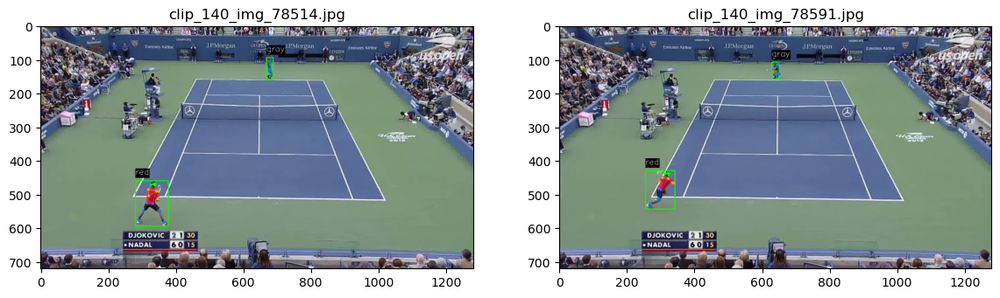

In [131]:
clip_num = 140
title = f'clip_{clip_num}'
fs = serve_pts.get(clip_num)
plot_frames(results_df, fs, title, data_args.local_img_folder)

In [132]:
def add_turn_attribs(df):
    window_size = 29
    min_window = 1
    df['x_minf'] = df['x'].rolling(window_size, min_periods=min_window).min().shift(-(window_size-1))
    df['x_minp'] = df['x'].rolling(window_size, min_periods=min_window).min()
    df['x_maxf'] = df['x'].rolling(window_size, min_periods=min_window).max().shift(-(window_size-1))
    df['x_maxp'] = df['x'].rolling(window_size, min_periods=min_window).max()
    
    df['y_minf'] = df['y'].rolling(window_size, min_periods=min_window).min().shift(-(window_size-1))
    df['y_minp'] = df['y'].rolling(window_size, min_periods=min_window).min()
    df['y_maxf'] = df['y'].rolling(window_size, min_periods=min_window).max().shift(-(window_size-1))
    df['y_maxp'] = df['y'].rolling(window_size, min_periods=min_window).max()
    
    f_cond, n_cond = ((df.y <= df.y_minp) & (df.y <= df.y_minf)), \
                     ((df.y >= df.y_maxp) & (df.y >= df.y_maxf) & (df.y >= 100)) 
    
    x_cond = ((df.x <= df.x_minp) & (df.x <= df.x_minf)) | \
             ((df.x >= df.x_maxp) & (df.x >= df.x_maxf))
    
    bdist_cond = ((df.n_bdist <= 130)|(df.f_bdist <= 130))
    
    df['xturn'] = (x_cond) 
    
    df['yturn'] = (f_cond | n_cond )
    
    df['only_turn'] = (f_cond | n_cond | x_cond) 
    
    df['turn'] = (f_cond | n_cond | x_cond) & (bdist_cond)
    
    df['side'] = np.where(f_cond, 'F', np.where(n_cond, 'N', np.where(df.f_bdist<120, 'F', np.where(df.n_bdist, 'N', np.nan))))
    
    df['side'] = np.where(f_cond, 'F', np.where(n_cond, 'N', \
                         np.where(df.f_bdist<120, 'F', \
                         np.where(df.n_bdist<120, 'N', \
                         np.where(df.f_bdist<df.n_bdist, 'F', \
                         np.where(df.n_bdist<df.f_bdist, 'N',np.nan))))))

    #overrides
    #if df.iloc[0].clip_num==87:
    df.loc['img_55456.jpg',['turn']] = [True]
    df.loc['img_55588.jpg':'img_55591.jpg','side'] = 'F'
    df.loc['img_55588.jpg':'img_55591.jpg','turn'] = True
    #if df.iloc[0].clip_num==88:
    df.loc['img_56721.jpg',['turn','side']] = [True, 'F']
    
    return df
    
results_df = add_turn_attribs(results_df)
results_df.shape                          

(54343, 75)

In [136]:
# clip_df = filter_clip(results_df, 66)
# add_turn_attribs(clip_df)
# clip_df.loc['img_32134.jpg']
# f_cond, n_cond = ((clip_df.y <= clip_df.y_minp) & (clip_df.y <= clip_df.y_minf)), \
#                      ((clip_df.y >= clip_df.y_maxp) & (clip_df.y >= clip_df.y_maxf) & (clip_df.y >= 100)) 
# x_cond = ((clip_df.x <= clip_df.x_minp) & (clip_df.x <= clip_df.x_minf)) | \
#              ((clip_df.x >= clip_df.x_maxp) & (clip_df.x >= clip_df.x_maxf))

# f_cond.loc['img_32134.jpg'], n_cond.loc['img_32134.jpg'], x_cond.loc['img_32134.jpg'], clip_df.loc['img_32134.jpg'].only_turn, clip_df.loc['img_32134.jpg'].turn

# #clip_df.loc[(clip_df.index>s1) & (clip_df.index<(pt_end_f if pt_end_f else (s2 if s2 else clip_df.index.values[-1]))) & (clip_df.turn==True)]

In [137]:
# end_pts_mod[100] = end_pts_mod.get(102)
# results_df.loc[results_df.clip_num==102,['clip_num']] = 100
# del end_pts_mod[102]

In [138]:
def add_vel_acc(df):
    df['ball_c'] = df[['x', 'y']].to_numpy().tolist()
    df.loc[:,'x_vel'] = calc_delta_per_frame(df, 'x')
    df.loc[:,'y_vel'] = calc_delta_per_frame(df, 'y')
    df.loc[:,'ball_vel'] = calc_delta_per_frame(df, 'ball_c')
    df.loc[:,'x_acc'] = calc_delta_per_frame(df, 'x_vel').shift(1)
    df.loc[:,'y_acc'] = calc_delta_per_frame(df, 'y_vel').shift(1)
    df.loc[:,'ball_acc'] = calc_delta_per_frame(df, 'ball_vel').shift(1)
        

In [139]:
def add_theta(df, t=1):
    df['x_p'+str(t)] = df['x'].rolling(t, min_periods=max(1,t-2)).mean().shift(1).round(1)
    df['y_p'+str(t)] = df['y'].rolling(t, min_periods=max(1,t-2)).mean().shift(1).round(1)
    df['x_f'+str(t)] = df['x'].rolling(t, min_periods=max(1,t-2)).mean().shift(-t).round(1)
    df['y_f'+str(t)] = df['y'].rolling(t, min_periods=max(1,t-2)).mean().shift(-t).round(1)
    #df['vec_x'+str(t)] = df['x_f'+str(t)] - df['x_p'+str(t)]
    #df['vec_y'+str(t)] = df['y_f'+str(t)] - df['y_p'+str(t)]
    df['vec_x'+str(t)] = df['x_f'+str(t)] - df['x']
    df['vec_y'+str(t)] = df['y_f'+str(t)] - df['y']
    df['vec_mod'+str(t)] = np.sqrt(df['vec_x'+str(t)]**2+df['vec_y'+str(t)]**2).round(1)
    df['vec_mod'+str(t)] = df['vec_mod'+str(t)].fillna(method='bfill')
    df['theta'+str(t)] = (np.arctan(np.abs(df['vec_y'+str(t)]/df['vec_x'+str(t)]))*180/math.pi).round()
    df['theta'+str(t)] = np.where(df['vec_mod'+str(t)]>55,np.nan,df['theta'+str(t)])    
   
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]>0) & (df['vec_y'+str(t)]>0)), df['theta'+str(t)], df['theta'+str(t)]) 
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]>0) & (df['vec_y'+str(t)]<0)),  360-df['theta'+str(t)], df['theta'+str(t)]) 
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]<0) & (df['vec_y'+str(t)]<0)), 180+df['theta'+str(t)], df['theta'+str(t)]) 
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]<0) & (df['vec_y'+str(t)]>0)), 180-df['theta'+str(t)], df['theta'+str(t)])
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]==0) & (df['vec_y'+str(t)]>0)), 90, df['theta'+str(t)]) 
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]==0) & (df['vec_y'+str(t)]<0)), 270, df['theta'+str(t)]) 
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]>0) & (df['vec_y'+str(t)]==0)), 360, df['theta'+str(t)]) 
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]<0) & (df['vec_y'+str(t)]==0)), 180, df['theta'+str(t)]) 
    df['theta'+str(t)] = df['theta'+str(t)].fillna(method='bfill')
    
    df['theta'+str(t)+'_delta'] = abs(df['theta'+str(t)] - df['theta'+str(t)].shift(1))
    df['theta'+str(t)+'_delta'] = np.where(df['theta'+str(t)+'_delta'] > 180, 360-df['theta'+str(t)+'_delta'], df['theta'+str(t)+'_delta']) 
    cond1 = df['theta'+str(t)]>df['theta'+str(t)].shift(1)
    cond2 = (df['theta'+str(t)]>=0) & (df['theta'+str(t)]<=90) & (df['theta'+str(t)].shift(1)>=270) & (df['theta'+str(t)].shift(1)<=360)
    df['theta'+str(t)+'_delta']  = np.where(cond1|cond2 , df['theta'+str(t)+'_delta'], -df['theta'+str(t)+'_delta'])
    df['theta'+str(t)+'_delta_cumm'] = df['theta'+str(t)+'_delta'].rolling(3).sum().shift(-2).round(1)
    

In [140]:
def neg_side(side):
    return 'N' if side[-1]=='F' else 'F' 

def pick_best_hit(df,turn_only=False):
    logging.debug(f'df : {df.shape}')
    if len(np.unique(df.side))>1:
       logging.debug('inside pick best')
       logging.debug(df[['side']])
       raise ValueError(f"Multiple sides found in turn_df")
    df['abs_theta1_delta'] = df['theta1_delta'].abs()
    df['theta_dist'] = abs(df['abs_theta1_delta']) + abs(df['y_f25']) 
    sort_cols = ['theta_dist']
    sel_row = df.sort_values(by=sort_cols, ascending=False).iloc[0]
    sel_row = df.iloc[0] if turn_only else sel_row
    #logger.debug(f'sel_row: {sel_row}')
    #cond_moving = (sel_row.side=='N' and sel_row.y_f25<-60) or (sel_row.side=='F' and sel_row.y_f25>60)
    cond_moving = abs(sel_row.y_f25)>50
    cond_moving = abs(sel_row.y_f25)>27
    cond_jump = (sel_row.y_m25>30) | (sel_row.y_mf10>167)
    cond_net = abs(sel_row.y*2-np.average(sel_row.kp.squeeze()[12:14], axis=0, weights=np.array([0.6,0.4]))[1]) < 60
    cond_net = abs(sel_row.y*2-np.average(sel_row.kp.squeeze()[12:14], axis=0, weights=np.array([0.6,0.4]))[1]) < 100
    shot_type = 'R' if (cond_moving and not cond_jump) else ('T' if cond_net else 'E')
    shot_type = ('T' if cond_net else 'E') if turn_only else shot_type
    logging.debug(f'cond_moving: {cond_moving, abs(sel_row.y_f25)}  cond_jump:{cond_jump} cond_net: {cond_net}')
    return sel_row.name, sel_row.side, shot_type

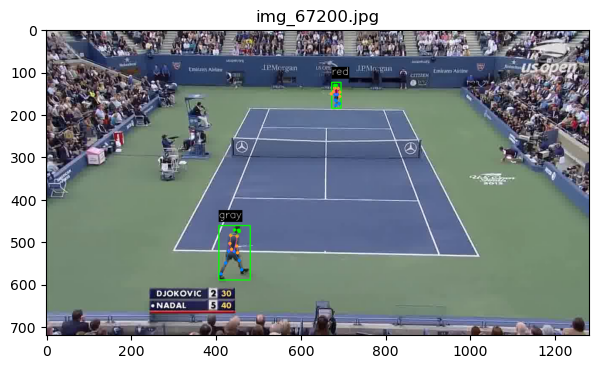

In [141]:

img_name = 'img_67200.jpg'
img_path = str(IMG_FOLDER/img_name)
img = cv2.imread(img_path)
img = draw_bbox_with_label(img, results_df.loc[img_name]['f_bb'], results_df.loc[img_name]['f_kp'], results_df.loc[img_name]['f_p'])
img = draw_bbox_with_label(img, results_df.loc[img_name]['n_bb'], results_df.loc[img_name]['n_kp'], results_df.loc[img_name]['n_p'])
plt.figure(figsize=(7,4))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
plt.title(img_name)
plt.show()

In [142]:
from itertools import zip_longest
reset_logging()
logging.basicConfig(level=logging.INFO)
cond7 = (results_df.x.rolling(60, min_periods=0).apply(lambda x: x.isna().sum()).shift(-59)>51) & (results_df.x.isna())

def find_pt_hits(serve_hit_pts, end_pts_mod, clip_df):
    clip_pts = []
    clip_num = clip_df.iloc[0].clip_num
    c_serve_pts = serve_hit_pts.get(clip_num)
    add_vel_acc(clip_df)
    add_theta(clip_df)
    #clip_df = add_turn_attribs(clip_df)
    zero_out = results_df.loc[cond7 & (results_df.clip_num==clip_num)].index.values
    zero_out = [z for z in zero_out if fname2int(z)>fname2int(c_serve_pts[0])] if c_serve_pts else zero_out
    logging.debug(f'zero out: {zero_out}')
    if len(zero_out)>2: 
        clip_df.loc[zero_out[2]:None if ((not c_serve_pts) or (len(c_serve_pts)==1)) else c_serve_pts[1],['x','y']] = [np.nan, np.nan]
    clip_df['y_d1'] = calc_delta_per_frame(clip_df, 'y')
    clip_df['y_d1'] = clip_df['y_d1'].fillna(method='ffill', limit=7)
    clip_df['y_m25'] = clip_df['y_d1'].abs().rolling(25, min_periods=10).max().shift(-25)
    clip_df['y_f10'] = clip_df['y_d1'].rolling(10, min_periods=5).sum().shift(-10)
    clip_df['y_mf10'] = clip_df['y_f10'].abs().rolling(30, min_periods=10).max().shift(-25)
    clip_df['y_f25'] = clip_df['y_d1'].rolling(25, min_periods=10).sum().shift(-25)
    c_serve_pts = [clip_df.index.values[0]] if not c_serve_pts else c_serve_pts
    temp_df = pd.DataFrame(columns=clip_df.columns) 
    first_s = clip_df[clip_df.turn==True].iloc[0]['side']
    logging.debug(f'start frame: {clip_df[clip_df.turn==True].iloc[0].name} end frame: {clip_df[clip_df.turn==True].iloc[-1].name}')
    for s1,s2 in zip_longest(c_serve_pts, c_serve_pts[1:]):
        logging.debug(f'entering for: {s1} {s2}')
        pt_hits, best_t, best_f = [], None, None
        end_pts = sorted(end_pts_mod.get(clip_num)) if end_pts_mod.get(clip_num) else None
        pt_end_fs = [ep for ep in end_pts if (fname2int(ep)>fname2int(s1)) and (fname2int(ep)<(1e6 if s2 is None else fname2int(s2)))] if end_pts else None
        pt_end_f = pt_end_fs[0] if (pt_end_fs and len(pt_end_fs)>0) else None
        logging.debug(f'end pts: {pt_end_f} {s2} {(pt_end_f if pt_end_f else (s2 if s2 else True))}')
        #display(clip_df[sel_cols])
        turn_df = clip_df.loc[(clip_df.index>s1) & (clip_df.index<(pt_end_f if pt_end_f else (s2 if s2 else clip_df.index.values[-1]))) & (clip_df.turn==True)]
        logging.debug(f'turn_df: {turn_df.shape}')
        if serve_hit_pts.get(clip_num):
            s_t = [s1,'F','S'] if (clip_df['hraised_side'].fillna(method='ffill').loc[s1][0]=='F') else \
                   [s1,'N','S'] if (clip_df['hraised_side'].fillna(method='ffill').loc[s1][0]=='N') else (s1,'S')
            pt_hits.append(s_t)
            best_f, best_s, best_t = s1, s_t[1], s_t[1][-1]
            logging.debug(f'serve appended to pt hits: {pt_hits}')
        while len(turn_df)>0:
            logging.debug(f'while loop turn df: {turn_df.shape}')
            top_row = turn_df.iloc[0]
            find_s = neg_side(pt_hits[-1][1]) if len(pt_hits)>0 else first_s
            logging.debug(f'turn_df shape: {turn_df.shape} find_s: {find_s} {top_row.side} {top_row.name}')
            if fname2int(top_row.name)<fname2int(s1):
                turn_df = turn_df.iloc[1:] 
                print(f'top row: {top_row.name} is less than {s1}')
            
            elif top_row.side==find_s:
                logging.debug('entering elif')
                pop_row = turn_df.iloc[0]
                turn_df = turn_df.iloc[1:] 
                temp_df = temp_df.append(pop_row, ignore_index=False)
                logging.debug(f'Inserting to temp: {find_s} {top_row.name} {pop_row.name} {pop_row.side} turn_df shape: {turn_df.shape}')
            else:
                if len(temp_df)==0: 
                    turn_df = turn_df.iloc[1:] 
                    continue
                best_f, best_s, best_t = pick_best_hit(temp_df)
                logging.debug(f'found best 1: {best_f} {best_s} {best_t}')
                pt_hits.append([best_f, best_s, best_t])
                temp_df = pd.DataFrame(columns=clip_df.columns)
                if best_t in ('T','E'):
                    logging.debug(f'clip: {clip_num} final_pt1 {pt_hits}')
                    break
        
        if len(temp_df)>0:
            best_f, best_s, best_t = pick_best_hit(temp_df)
            logging.debug(f'found best 2: {best_f} {best_s} {best_t}')
            temp_df = pd.DataFrame(columns=clip_df.columns)
            pt_hits.append([best_f, best_s, best_t])
      
        if best_t not in ('T','E'):
            pt_end_f = results_df.iloc[results_df.index.get_loc(pt_end_f)+41].name if pt_end_f else None
            logging.debug(f'pt_end_f: {pt_end_f} {best_f} {best_s}')
            only_turn_df = clip_df.loc[(clip_df.index>s1) & (clip_df.index<=(pt_end_f if pt_end_f else (s2 if s2 else clip_df.index.values[-1]))) & (clip_df.only_turn==True)]
            logging.debug(f'only turn df: {only_turn_df.index.values}')
            temp_df = only_turn_df[(only_turn_df.index>best_f)&(only_turn_df.side==neg_side(best_s))]
            if temp_df.shape[0]==0: 
                logging.debug(f'Skipping final point. final_pt2 {pt_hits}')
            else:
                logging.debug(f"best_f: {best_f} best_s: {best_s} pt hits: {pt_hits} final temp_df: {temp_df['turn']}")
                fin_f, fin_s, fin_t =  pick_best_hit(temp_df, turn_only=True)
                temp_df = pd.DataFrame(columns=clip_df.columns)
                logging.debug(f'final pick: {fin_f} {fin_s} {fin_t}')
                pt_hits.append([fin_f, fin_s, fin_t])
                logging.debug(f'clip: {clip_num} final_pt2 {pt_hits}')
    
        clip_pts.append(pt_hits)
    return clip_pts
    

In [148]:
import math
warnings.filterwarnings('ignore')
reset_logging()
configure_logging(False)
clip_num =251
clip_df = filter_clip(results_df, clip_num)
find_pt_hits(serve_hit_pts, end_pts_mod, clip_df) 

[[['img_106932.jpg', 'F', 'R'],
  ['img_106977.jpg', 'N', 'R'],
  ['img_107026.jpg', 'F', 'R'],
  ['img_107064.jpg', 'N', 'R'],
  ['img_107104.jpg', 'F', 'R'],
  ['img_107141.jpg', 'N', 'R'],
  ['img_107180.jpg', 'F', 'R'],
  ['img_107216.jpg', 'N', 'R'],
  ['img_107258.jpg', 'F', 'R'],
  ['img_107290.jpg', 'N', 'R'],
  ['img_107335.jpg', 'F', 'R'],
  ['img_107375.jpg', 'N', 'R'],
  ['img_107415.jpg', 'F', 'R'],
  ['img_107447.jpg', 'N', 'R'],
  ['img_107498.jpg', 'F', 'R'],
  ['img_107550.jpg', 'N', 'E']]]

In [149]:
reset_logging()
configure_logging(False)
warnings.filterwarnings('ignore')
final_pts = apply_func_all_clips(results_df, partial(find_pt_hits, serve_hit_pts, end_pts_mod))

2024-07-24 17:52:02,230 - root - apply_func_all_clips - INFO - processing clip: 0 shape: (466, 75)
2024-07-24 17:52:02,914 - root - apply_func_all_clips - INFO - processing clip: 1 shape: (621, 75)
2024-07-24 17:52:03,718 - root - apply_func_all_clips - INFO - processing clip: 2 shape: (733, 75)
2024-07-24 17:52:04,493 - root - apply_func_all_clips - INFO - processing clip: 3 shape: (615, 75)
2024-07-24 17:52:05,072 - root - apply_func_all_clips - INFO - processing clip: 4 shape: (569, 75)
2024-07-24 17:52:05,827 - root - apply_func_all_clips - INFO - processing clip: 5 shape: (355, 75)
2024-07-24 17:52:06,361 - root - apply_func_all_clips - INFO - processing clip: 6 shape: (546, 75)
2024-07-24 17:52:07,045 - root - apply_func_all_clips - INFO - processing clip: 7 shape: (809, 75)
2024-07-24 17:52:08,035 - root - apply_func_all_clips - INFO - processing clip: 8 shape: (351, 75)
2024-07-24 17:52:08,556 - root - apply_func_all_clips - INFO - processing clip: 32 shape: (1014, 75)
2024-07-

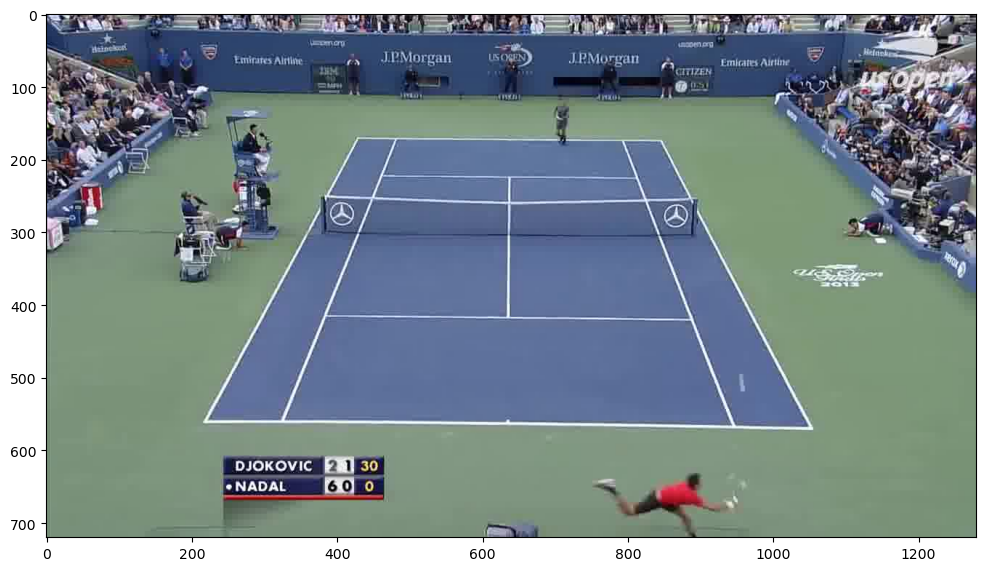

In [150]:
test_f = str(Path(local_img_folder)/'img_77235.jpg')
plt.figure(figsize=(12,12))
plt.imshow(plt.imread(test_f,'test'))

In [151]:
final_pts.get(100)

[[['img_60953.jpg', 'N', 'S'],
  ['img_60961.jpg', 'F', 'R'],
  ['img_61010.jpg', 'N', 'T']],
 [['img_61334.jpg', 'N', 'S'],
  ['img_61366.jpg', 'F', 'R'],
  ['img_61398.jpg', 'N', 'R'],
  ['img_61442.jpg', 'F', 'R'],
  ['img_61474.jpg', 'N', 'R'],
  ['img_61521.jpg', 'F', 'R'],
  ['img_61557.jpg', 'N', 'E']]]

In [152]:
#no correction: 2, 7, 39, 40, 58, 59, 64, 67, 71, 78
#requires correction:
    #last frame issue: 4, 79, 83, 107, 
    #other issue: 
final_pts_old = json.load( open( "final_pts_old.json" ) )
for clip_num, pts in final_pts_old.items():
    if pts!=final_pts.get(eval(clip_num)):
        print(f'clip:{clip_num} \n old: {pts} \n new: {final_pts.get(eval(clip_num))}')

clip:2.0 
 old: [[['img_2578.jpg', 'F', 'R'], ['img_2616.jpg', 'N', 'R'], ['img_2662.jpg', 'F', 'R'], ['img_2695.jpg', 'N', 'R'], ['img_2747.jpg', 'F', 'R'], ['img_2780.jpg', 'N', 'R'], ['img_2824.jpg', 'F', 'R'], ['img_2859.jpg', 'N', 'R'], ['img_2906.jpg', 'F', 'R'], ['img_2938.jpg', 'N', 'R'], ['img_2972.jpg', 'F', 'R'], ['img_3011.jpg', 'N', 'R'], ['img_3050.jpg', 'F', 'R'], ['img_3089.jpg', 'N', 'R'], ['img_3126.jpg', 'F', 'R'], ['img_3162.jpg', 'N', 'R'], ['img_3216.jpg', 'F', 'E']]] 
 new: [[['img_2578.jpg', 'F', 'R'], ['img_2616.jpg', 'N', 'R'], ['img_2662.jpg', 'F', 'R'], ['img_2695.jpg', 'N', 'R'], ['img_2747.jpg', 'F', 'R'], ['img_2780.jpg', 'N', 'R'], ['img_2824.jpg', 'F', 'R'], ['img_2859.jpg', 'N', 'R'], ['img_2906.jpg', 'F', 'R'], ['img_2938.jpg', 'N', 'R'], ['img_2972.jpg', 'F', 'R'], ['img_3011.jpg', 'N', 'R'], ['img_3050.jpg', 'F', 'R'], ['img_3089.jpg', 'N', 'R'], ['img_3126.jpg', 'F', 'R'], ['img_3162.jpg', 'N', 'R'], ['img_3211.jpg', 'F', 'E']]]
clip:4.0 
 old: [[[

In [153]:
corrections_dict = defaultdict(dict)
corrections_dict[4] = { 'insert':[['img_5583.jpg', 'N', 'R'],['img_5647.jpg', 'F', 'E']], 'remove': []}
corrections_dict[7] = { 'insert':[['img_8498.jpg', 'N', 'E']], 'remove': []}
corrections_dict[74] = {'insert':[['img_42123.jpg', 'F', 'R'],['img_42136.jpg', 'N', 'T']], 'remove': []}
corrections_dict[79] = {'insert':[['img_45658.jpg', 'N', 'T']], 'remove': [['img_45807.jpg', 'N', 'R'], ['img_45826.jpg', 'F', 'E']]}
corrections_dict[83] = {'insert':[['img_51274.jpg', 'F', 'E']], 'remove': [['img_51289.jpg', 'N', 'T']]}
corrections_dict[100] = {'insert':[], 'remove': [['img_60961.jpg', 'F', 'R']]}
corrections_dict[107] = {'insert':[['img_67158.jpg', 'N', 'E']], 'remove': [['img_67201.jpg', 'F', 'R'], ['img_67233.jpg', 'N', 'E']]}
corrections_dict[117] = {'insert':[['img_76829.jpg', 'F', 'R']], 'remove': [['img_76852.jpg', 'F', 'R']]}
corrections_dict[200] = {'insert':[['img_99815.jpg', 'F', 'E']], 'remove': []}


In [154]:
# 4 = { 'insert':[['img_5583.jpg', 'N', 'R'],['img_5647.jpg', 'F', 'E']], 'remove': []}
# 7 = { 'insert':[['img_8498.jpg', 'N', 'E']], 'remove': []}
# 74 = {'insert':[['img_42123.jpg', 'F', 'R'],['img_42136.jpg', 'N', 'T']], 'remove': []}
# 79 = {'insert':[['img_45658.jpg', 'N', 'T']], 'remove': [['img_45807.jpg', 'N', 'R'], ['img_45826.jpg', 'F', 'E']]}
# 83 = {'insert':[['img_51274.jpg', 'F', 'E']], 'remove': [['img_51289.jpg', 'N', 'T']]}
# 100 = {'insert':[], 'remove': [['img_60961.jpg', 'F', 'R']]}
# 107 = {'insert':[['img_67158.jpg', 'N', 'E']], 'remove': [['img_67201.jpg', 'F', 'R'], ['img_67233.jpg', 'N', 'E']]}
# 117 = {'insert':[['img_76829.jpg', 'F', 'R']], 'remove': [['img_76852.jpg', 'F', 'R']]}
# 200 = {'insert':[['img_99815.jpg', 'F', 'E']], 'remove': []}


In [155]:
def find_last_true(bool_list):
    try:
        return len(bool_list)-1-list(reversed(bool_list)).index(True)
    except ValueError:
        return 0

def insert_correction(pts_lists, ins_tup):
    pt_idx = find_last_true([ins_tup[0]>pts_list[0][0] for pts_list in pts_lists])
    pts_list = pts_lists[pt_idx]
    for idx, (pt1_tup, pt2_tup) in enumerate(zip(pts_list, pts_list[1:])):
        if ins_tup[0]==pt1_tup[0]: pts_list[idx] = ins_tup; return
        elif ins_tup[0]>pt1_tup[0] and ins_tup[0]<pt2_tup[0]: pts_list.insert(idx+1, ins_tup); return 
        elif idx==0 and ins_tup[0]<pt1_tup[0]: pts_list.insert(idx, ins_tup); return 
        elif idx==len(pts_list)-2 and ins_tup[0]==pt2_tup[0]: pts_list[idx+1] = ins_tup; return
        elif idx==len(pts_list)-2 and ins_tup[0]>pt2_tup[0]: pts_list.insert(idx+2, ins_tup); return 
        

def remove_correction(pts_lists, rem_tup):
    for pts_list in pts_lists:
        for idx, pt_tup in enumerate(pts_list):
            if rem_tup[0]==pt_tup[0]: pts_list.pop(idx); return


In [157]:
import copy
test_pts = {}
for k,v in final_pts.items(): test_pts[k] = copy.deepcopy(v)
insert_correction(test_pts.get(0), ['img_0700.jpg', 'F', 'E'])
insert_correction(test_pts.get(0), ['img_1100.jpg', 'F', 'E'])
insert_correction(test_pts.get(0), ['img_0892.jpg', 'F', 'E'])
insert_correction(test_pts.get(0), ['img_1000.jpg', 'F', 'E'])
final_pts.get(0), test_pts.get(0), len(final_pts.get(0)[0]), len(test_pts.get(0)[0])

([[['img_0792.jpg', 'F', 'S'],
   ['img_0812.jpg', 'N', 'R'],
   ['img_0856.jpg', 'F', 'R'],
   ['img_0892.jpg', 'N', 'R'],
   ['img_0963.jpg', 'F', 'R'],
   ['img_0997.jpg', 'N', 'R'],
   ['img_1043.jpg', 'F', 'E']]],
 [[['img_0700.jpg', 'F', 'E'],
   ['img_0792.jpg', 'F', 'S'],
   ['img_0812.jpg', 'N', 'R'],
   ['img_0856.jpg', 'F', 'R'],
   ['img_0892.jpg', 'F', 'E'],
   ['img_0963.jpg', 'F', 'R'],
   ['img_0997.jpg', 'N', 'R'],
   ['img_1000.jpg', 'F', 'E'],
   ['img_1043.jpg', 'F', 'E'],
   ['img_1100.jpg', 'F', 'E']]],
 7,
 10)

In [158]:
import copy
for k,v in final_pts.items(): test_pts[k] = copy.deepcopy(v)
insert_correction(test_pts.get(4), ['img_5583.jpg', 'N', 'R'])
final_pts.get(4), test_pts.get(4), len(final_pts.get(4)[0]), len(test_pts.get(4)[0])

([[['img_5395.jpg', 'F', 'S'],
   ['img_5421.jpg', 'N', 'R'],
   ['img_5465.jpg', 'F', 'R'],
   ['img_5497.jpg', 'N', 'R'],
   ['img_5552.jpg', 'F', 'R'],
   ['img_5583.jpg', 'N', 'E']]],
 [[['img_5395.jpg', 'F', 'S'],
   ['img_5421.jpg', 'N', 'R'],
   ['img_5465.jpg', 'F', 'R'],
   ['img_5497.jpg', 'N', 'R'],
   ['img_5552.jpg', 'F', 'R'],
   ['img_5583.jpg', 'N', 'R']]],
 6,
 6)

In [160]:
for k,v in final_pts.items(): test_pts[k] = copy.deepcopy(v)
remove_correction(test_pts.get(0), ['img_0792.jpg', 'F', 'S'])
remove_correction(test_pts.get(0), ['img_1043.jpg', 'F', 'E'])
final_pts.get(0), test_pts.get(0), len(final_pts.get(0)[0]), len(test_pts.get(0)[0])

([[['img_0792.jpg', 'F', 'S'],
   ['img_0812.jpg', 'N', 'R'],
   ['img_0856.jpg', 'F', 'R'],
   ['img_0892.jpg', 'N', 'R'],
   ['img_0963.jpg', 'F', 'R'],
   ['img_0997.jpg', 'N', 'R'],
   ['img_1043.jpg', 'F', 'E']]],
 [[['img_0812.jpg', 'N', 'R'],
   ['img_0856.jpg', 'F', 'R'],
   ['img_0892.jpg', 'N', 'R'],
   ['img_0963.jpg', 'F', 'R'],
   ['img_0997.jpg', 'N', 'R']]],
 7,
 5)

In [161]:
def apply_corrections(final_pts, corrections_dict):  
    for clip_num, corrections in corrections_dict.items():
        logging.debug(f'processing clip: {clip_num}')
        insert_pts, remove_pts = corrections.get('insert'), corrections.get('remove')
        for ins_tup in insert_pts: insert_correction(final_pts.get(clip_num), ins_tup)
        for rem_tup in remove_pts: remove_correction(final_pts.get(clip_num), rem_tup) 

In [162]:
reset_logging()
logging.basicConfig(level=logging.INFO)
for k,v in final_pts.items(): test_pts[k] = copy.deepcopy(v)
apply_corrections(test_pts, corrections_dict)

In [163]:
final_pts_old = json.load( open( "final_pts_old.json" ) )
for clip_num, pts in final_pts_old.items():
    if pts!=test_pts.get(eval(clip_num)):
        print(f'clip:{clip_num} \n old: {pts} \n new: {test_pts.get(eval(clip_num))}')

clip:2.0 
 old: [[['img_2578.jpg', 'F', 'R'], ['img_2616.jpg', 'N', 'R'], ['img_2662.jpg', 'F', 'R'], ['img_2695.jpg', 'N', 'R'], ['img_2747.jpg', 'F', 'R'], ['img_2780.jpg', 'N', 'R'], ['img_2824.jpg', 'F', 'R'], ['img_2859.jpg', 'N', 'R'], ['img_2906.jpg', 'F', 'R'], ['img_2938.jpg', 'N', 'R'], ['img_2972.jpg', 'F', 'R'], ['img_3011.jpg', 'N', 'R'], ['img_3050.jpg', 'F', 'R'], ['img_3089.jpg', 'N', 'R'], ['img_3126.jpg', 'F', 'R'], ['img_3162.jpg', 'N', 'R'], ['img_3216.jpg', 'F', 'E']]] 
 new: [[['img_2578.jpg', 'F', 'R'], ['img_2616.jpg', 'N', 'R'], ['img_2662.jpg', 'F', 'R'], ['img_2695.jpg', 'N', 'R'], ['img_2747.jpg', 'F', 'R'], ['img_2780.jpg', 'N', 'R'], ['img_2824.jpg', 'F', 'R'], ['img_2859.jpg', 'N', 'R'], ['img_2906.jpg', 'F', 'R'], ['img_2938.jpg', 'N', 'R'], ['img_2972.jpg', 'F', 'R'], ['img_3011.jpg', 'N', 'R'], ['img_3050.jpg', 'F', 'R'], ['img_3089.jpg', 'N', 'R'], ['img_3126.jpg', 'F', 'R'], ['img_3162.jpg', 'N', 'R'], ['img_3211.jpg', 'F', 'E']]]
clip:4.0 
 old: [[[

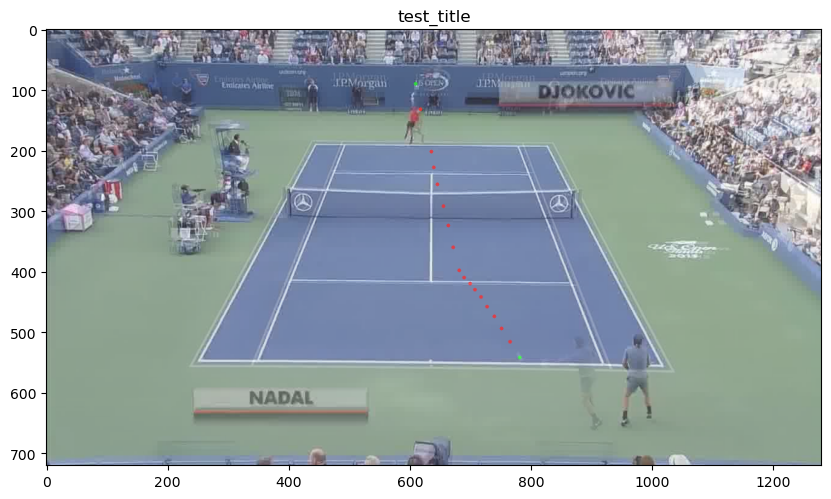

In [164]:
img_name1, img_name2 = 'img_0792.jpg', 'img_0812.jpg'
_, ax = plt.subplots(figsize=(10,6))
def plot_shot(df, img_name1, img_name2, color, radius, thickness, ax=None, title='test_title', plot_pt=None):
    image1 = cv2.imread(str(IMG_FOLDER/img_name1))
    image2 = cv2.imread(str(IMG_FOLDER/img_name2))
    for idx, (x,y) in enumerate(df.loc[img_name1:img_name2][['x','y']].values):
        if not (np.isnan(x) or np.isnan(y)): 
            color = (0, 255, 0) if idx in (0,df.loc[img_name1:img_name2].shape[0]-1) else (0, 0, 255) 
            cv2.circle(image1, (int(x*2), int(y*2)), radius, color, -1)
    pts = df.loc[img_name1:img_name2][['x','y']].values*2
    #s_pt, e_pt, pts = pts[0], results_df.loc[img_name2][['x','y']].values*2, pts[1:]
    #idx, (x_f, y_f) = find_farthest_point_right(s_pt, 'D',e_pt, pts)
    #cv2.circle(image, (int(x_f), int(y_f)), radius+1, (0, 255, 0), -1)
    #x1,y1 = list(map(int,df.loc[img_name1][['x','y']].values))
    #x2,y2 = list(map(int,df.loc[img_name2][['x','y']].values))
    #cv2.line(image1, (x1*2, y1*2), (x2*2, y2*2), (0, 255, 0), thickness)
    if not ax: _, ax = plt.subplots(figsize=(14,8))
    ax.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB), alpha=0.8)
    ax.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB), alpha=0.2)
    if plot_pt: ax.scatter(plot_pt[0], plot_pt[1],s=3, color='b')
    ax.set_title(title)
plot_shot(results_df, img_name1, img_name2, (0, 0, 255), 3, 2, ax)

In [165]:
import warnings
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.preprocessing import PolynomialFeatures
from scipy.optimize import fsolve
import math


def l2_error(y, y_pred):
    return np.sum((y-y_pred)**2)


def fit_model(x, y, degree=3, alpha=0.1):
    poly_features = PolynomialFeatures(degree=degree, include_bias=True)  
    x_p = poly_features.fit_transform(x)
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", RuntimeWarning)
        warnings.simplefilter("ignore", UserWarning)
        model = Ridge(alpha=alpha if alpha else 0)
        model.fit(x_p, y)
        y_pred = model.predict(x_p)
        error = l2_error(y, y_pred)
        return model, y_pred, error
    
def find_curves_w_error(x, y, cut_idx, d1=4, d2=3, a1=0.1, a2=0.1):
    x, y = x.reshape(-1,1), y.reshape(-1,1)
    x1, x2 = x[:cut_idx], x[cut_idx:]
    y1, y2 = y[:cut_idx], y[cut_idx:]
    if x1.shape[0]==0 or x2.shape[0]==0: return None, None, None, None, None
    m1, y1_pred, e1 = fit_model(x1, y1, degree=d1, alpha=a1)
    m2, y2_pred, e2 = fit_model(x2, y2, degree=d2, alpha=a2)
    return m1, m2, y1_pred, y2_pred, e1+e2
    
def find_farthest_point(line_point1, line_point2, points, side_point):
    x1, y1 = line_point1
    x2, y2 = line_point2
    if np.isnan([x1, y1, x2, y2]).any(): raise AttributeError(f'Error in find farthest point {x1} {y1} {x2} {y2}')

    cp = None
    if x1 == x2:
        slope = None
        y_intercept = None
    else:
        slope = (y2 - y1) / (x2 - x1)
        y_intercept = y1 - slope * x1

    def is_same_side(point, ref_point):
        def cross_product(a,b): return a[0]*b[1]-a[1]*b[0]
        x, y = point
        x_ref, y_ref = ref_point
        if slope is None:
             return True if (x-x1)*(x_ref-x1)>=0 else False, None, None
        else:
            line_vec = (x2 - x1, y2 - y1)
            point_vec = (x - x1, y - y1)
            ref_point_vec = (x_ref-x1, y_ref-y1)

            cp_pt = cross_product(line_vec, point_vec)
            cp_ref_pt = cross_product(line_vec, ref_point_vec)
            return True if (cp_pt * cp_ref_pt >= 0) else False, cp_pt, cp_ref_pt
            
        
    def distance_from_line(point):
        x, y = point
        if slope is None:
            # For vertical lines, the distance is the absolute difference in x-coordinates
            return abs(x - x1)
        else:
            # For non-vertical lines, use the perpendicular distance formula
            return abs((y - y_intercept) - slope * x) / math.sqrt(slope**2 + 1)

    max_distance = -1
    farthest_point = None
    for idx, point in enumerate(points):
        distance = distance_from_line(point)
        if distance > max_distance and is_same_side(point, side_point)[0]:
            logging.debug(f'idx: {idx} same_side:{is_same_side(point, side_point)} point: {point} sp: {side_point} x1,y1:{x1,y1} dist: {distance:0.0f}')
            max_distance = distance
            farthest_point = (idx,point)
    return farthest_point if farthest_point is not None else (idx,point)


def find_intersection(m1, m2, x_min, x_max, d=3):
    def equations(x):
        poly_features = PolynomialFeatures(degree=d, include_bias=True)  
        x_p = poly_features.fit_transform(x.reshape(-1,1))
        y1 = m1.predict(x_p)
        y2 = m2.predict(x_p)
        return y1[0] - y2[0]

    initial_guesses = np.linspace(x_min, x_max, 21) 
    roots = []
    for x0 in initial_guesses:
        solution_x = fsolve(equations, x0)
        if abs(equations(solution_x)) < 1e-6:  # Check for valid roots
            roots.append(solution_x.round(1))
    return np.unique(np.array(roots))


def closer_neighbour(x, y, cut_idx):
    logging.debug(f'closer neighbour - cut_idx: {cut_idx}, x: {x}')
    if cut_idx==0 or cut_idx==len(x)-1: return 0 
    d1 = abs(x[cut_idx]-x[cut_idx-1])
    d2 = abs(x[cut_idx+1]-x[cut_idx])
    #print(f'd1 d2 {d1} {d2}')
    return 0 if d1<=d2 else 1

In [166]:
reset_logging()
logging.basicConfig(level=logging.INFO)

def fit_curves(df, img_name1, img_name2, hypers, f_offset=None, debug=False, plot=True, local_offset=6):
    if img_name2 is None and f_offset is None: print('specify offset'); return
    if img_name2 is None: img_name1, img_name2 =  foffset_fname(df, img_name1, offset=-offset),  \
                                                  foffset_fname(df, img_name1, offset=offset)
            
    xy_df = df.loc[img_name1:img_name2,['x','y']]*2
    x_data, y_data, fs = xy_df.values[:,0], -xy_df.values[:,1], xy_df.index.values
    mask = ~np.isnan(x_data) & ~np.isnan(y_data)
    x_data, y_data, fs = x_data[mask], y_data[mask], fs[mask]
    ms_ys_es = [find_curves_w_error(x_data, y_data, cand_idx, **hypers) for cand_idx in range(1,len(x_data)-2)]
    opt_idx1, (e, m1, m2, y1_pred, y2_pred) = argmin(ms_ys_es, key=lambda x: (x[4],*x[:4]))
    opt_idx1 += 1
    pt1 = (x_data[opt_idx1], -y_data[opt_idx1])

    if debug:
        for idx,(m1,m2,_,_,e) in enumerate(ms_ys_es):
            print(f'idx: {idx+1} f: {fs[idx+1]} error: {e}')
        logging.debug(f'm1 coeff: {m1.coef_}, m2 coeff: {m2.coef_}')    

    opt_idx2, pt2 = find_farthest_point((x_data[0],y_data[0]),(x_data[-1],y_data[-1]),list(zip(x_data,y_data)), (pt1[0],-pt1[1]))
    clip_num = df.loc[img_name1].clip_num
    
    if plot:
        x1, x2, y1, y2 = x_data[:opt_idx1], x_data[opt_idx1:], y_data[:opt_idx1], y_data[opt_idx1:]
        if debug: print(f'{x1.shape}, {y1.shape}, {x2.shape}, {y2.shape} {y1_pred.shape} {y2_pred.shape}')
        plt.figure(figsize=(7,4))
        plt.plot(x1, y1, 'o', label='Data1')
        plt.plot(x1, y1_pred, label='Curve1')
        plt.plot(x2, y2, 'o', label='Data2')
        plt.plot(x2, y2_pred, label='Curve2')
        plt.scatter(x2[0], y2[0], color='r', s=100)
        plt.scatter(pt2[0], pt2[1], color='y', s=200)
        plt.plot((x_data[0],x_data[-1]),(y_data[0],y_data[-1]), color='y')
        plt.legend()
        plt.title(f'clip{clip_num}_{opt_idx1}_{fs[opt_idx1]}_{x_data[opt_idx1],y_data[opt_idx1]}')

    #print(f'inside fit curves: {pt1} {fs[opt_idx1]} {(pt2[0],-pt2[1])} {fs[opt_idx2]} end pts: {x_data[0],y_data[0]} {x_data[-1],y_data[-1]}')

    return pt1, fs[opt_idx1], (pt2[0],-pt2[1]), fs[opt_idx2]


In [167]:
reset_logging()
logging.basicConfig(level=logging.INFO)
hypers = {'d1':3, 'd2':2, 'a1':0.1, 'a2':0.1}

def add_bounce_to_point_hits(final_pts, clip_df, hypers=hypers):
    clip_num = clip_df.iloc[0].clip_num
    pt_tups = final_pts.get(clip_num)
    pt_results = [[] for _ in range(len(pt_tups))]
    #print(f'clip_num: {clip_num} len {len(pt_results)}')
    for pt_idx, pt_tup in enumerate(pt_tups):
        if len(pt_tup)==1: pt_results[pt_idx].append(pt_tup[0]); continue
        for s1_t, s2_t in zip(pt_tup, pt_tup[1:]):
            (s1_f, s1_s, s1_ty), (s2_f, s2_s, s2_ty) = s1_t, s2_t
            start_offset = 4 if s1_ty=='S' else 9 
            s1_f_mod, s2_f_mod = clip_df.iloc[clip_df.index.get_loc(s1_f)+start_offset].name, s2_f
            if s1_s=='N': s2_f_mod = clip_df.iloc[clip_df.index.get_loc(s2_f)-3].name
            if (fname2int(s2_f)-fname2int(s1_f))>65 and s2_ty in ('E','T'): 
                s2_f_mod = clip_df.iloc[clip_df.index.get_loc(s1_f)+40].name
            add_vel_acc(clip_df)
            if s2_ty=='T': 
                pt_results[pt_idx].append(s1_t)
            else:
                #_, ax = plt.subplots(figsize=(10,6))
                pt1, b_f1, pt2, b_f2 = fit_curves(clip_df, s1_f_mod, s2_f_mod, hypers, debug=False, plot=False, local_offset=6)
                pt_results[pt_idx].append(s1_t)
                pt_results[pt_idx].append([b_f2,'B','B'])
        pt_results[pt_idx].append(s2_t)
    return pt_results
   


In [168]:
test_pts.get(111)

[[['img_70636.jpg', 'F', 'E']]]

In [169]:
reset_logging()
logging.basicConfig(level=logging.INFO)
clip_df = filter_clip(results_df, 4)
add_bounce_to_point_hits(test_pts, clip_df)

[[['img_5395.jpg', 'F', 'S'],
  ['img_5408.jpg', 'B', 'B'],
  ['img_5421.jpg', 'N', 'R'],
  ['img_5453.jpg', 'B', 'B'],
  ['img_5465.jpg', 'F', 'R'],
  ['img_5488.jpg', 'B', 'B'],
  ['img_5497.jpg', 'N', 'R'],
  ['img_5537.jpg', 'B', 'B'],
  ['img_5552.jpg', 'F', 'R'],
  ['img_5569.jpg', 'B', 'B'],
  ['img_5583.jpg', 'N', 'R'],
  ['img_5603.jpg', 'B', 'B'],
  ['img_5647.jpg', 'F', 'E']]]

In [170]:
reset_logging()
logging.basicConfig(level=logging.INFO)
final_w_bounce_pts = apply_func_all_clips(results_df, partial(add_bounce_to_point_hits, test_pts))

INFO:root:processing clip: 0 shape: (466, 75)
INFO:root:processing clip: 1 shape: (621, 75)
INFO:root:processing clip: 2 shape: (733, 75)
INFO:root:processing clip: 3 shape: (615, 75)
INFO:root:processing clip: 4 shape: (569, 75)
INFO:root:processing clip: 5 shape: (355, 75)
INFO:root:processing clip: 6 shape: (546, 75)
INFO:root:processing clip: 7 shape: (809, 75)
INFO:root:processing clip: 8 shape: (351, 75)
INFO:root:processing clip: 32 shape: (1014, 75)
INFO:root:processing clip: 33 shape: (730, 75)
INFO:root:processing clip: 35 shape: (381, 75)
INFO:root:processing clip: 36 shape: (361, 75)
INFO:root:processing clip: 37 shape: (455, 75)
INFO:root:processing clip: 38 shape: (516, 75)
INFO:root:processing clip: 39 shape: (230, 75)
INFO:root:processing clip: 40 shape: (474, 75)
INFO:root:processing clip: 46 shape: (301, 75)
INFO:root:processing clip: 47 shape: (315, 75)
INFO:root:processing clip: 48 shape: (352, 75)
INFO:root:processing clip: 49 shape: (745, 75)
INFO:root:processing 

In [171]:
final_w_bounce_pts_old = json.load( open( "final_w_bounce_pts_old.json" ) )
for clip_num, pts in final_w_bounce_pts_old.items():
    if pts!=final_w_bounce_pts.get(eval(clip_num)):
        print(f'clip:{clip_num} \n old: {pts} \n new: {final_w_bounce_pts.get(eval(clip_num))}')

clip:2.0 
 old: [[['img_2578.jpg', 'F', 'R'], ['img_2601.jpg', 'B', 'B'], ['img_2616.jpg', 'N', 'R'], ['img_2646.jpg', 'B', 'B'], ['img_2662.jpg', 'F', 'R'], ['img_2683.jpg', 'B', 'B'], ['img_2695.jpg', 'N', 'R'], ['img_2736.jpg', 'B', 'B'], ['img_2747.jpg', 'F', 'R'], ['img_2768.jpg', 'B', 'B'], ['img_2780.jpg', 'N', 'R'], ['img_2808.jpg', 'B', 'B'], ['img_2824.jpg', 'F', 'R'], ['img_2843.jpg', 'B', 'B'], ['img_2859.jpg', 'N', 'R'], ['img_2896.jpg', 'B', 'B'], ['img_2906.jpg', 'F', 'R'], ['img_2930.jpg', 'B', 'B'], ['img_2938.jpg', 'N', 'R'], ['img_2959.jpg', 'B', 'B'], ['img_2972.jpg', 'F', 'R'], ['img_2998.jpg', 'B', 'B'], ['img_3011.jpg', 'N', 'R'], ['img_3033.jpg', 'B', 'B'], ['img_3050.jpg', 'F', 'R'], ['img_3075.jpg', 'B', 'B'], ['img_3089.jpg', 'N', 'R'], ['img_3114.jpg', 'B', 'B'], ['img_3126.jpg', 'F', 'R'], ['img_3155.jpg', 'B', 'B'], ['img_3162.jpg', 'N', 'R'], ['img_3196.jpg', 'B', 'B'], ['img_3216.jpg', 'F', 'E']]] 
 new: [[['img_2578.jpg', 'F', 'R'], ['img_2601.jpg', 'B'

In [199]:
d2.get(35), final_w_bounce_pts.get(35)

([[['img_13859.jpg', 'F', 'S'], ['img_13893.jpg', 'N', 'T']]],
 [[['img_13881.jpg', 'F', 'S'], ['img_13893.jpg', 'N', 'T']]])

In [202]:
serve_pts.get(35), serve_hit_pts.get(35)

(['img_13859.jpg'], ['img_13881.jpg'])

In [209]:
pd.read_pickle('../usopen_2013_1.0_serve_end_pts.pkl')[0].get(105)

['img_64627.jpg']

In [212]:
# d1, d2 = pd.read_pickle('../usopen_2013_1.0_hit_bounce_pts.pkl')
# for clip_num, pts in final_w_bounce_pts.items():
#     print(f'clip: {clip_num}')
#     if pts!=d2.get(clip_num):
#         print(f'clip:{clip_num} \n old: {pts} \n new: {d2.get(clip_num)}')

In [ ]:
pd.read_csv(

In [172]:
results_df['n_b'] = results_df['n_kp'].map(lambda x: np.array(x)[:4].mean(axis=0)[:2] if not np.isnan(x).any() else np.nan)
results_df['f_b'] = results_df['f_kp'].map(lambda x: np.array(x)[:4].mean(axis=0)[:2] if not np.isnan(x).any() else np.nan)

In [173]:
def tuple_shot(s_t, df=results_df, plot_chart=False):
    f, side, ty = s_t
    if side in ('N','F'):
        f_idx = df.index.get_loc(f)
        sel_cols = ['n_hs','f_hs','n_p','f_p','n_b','f_b','x','y']
        row = df.loc[f,sel_cols]
        shot = None
        player = row.n_p if side[-1]=='N' else row.f_p
        body_pt = row.n_b if side[-1]=='N' else row.f_b
        hands = row.n_hs.mean(axis=0) if ((not np.isnan(row.n_hs).any()) and (side[-1]=='N')) else \
                (row.f_hs.mean(axis=0) if ((not np.isnan(row.f_hs).any()) and (side[-1]=='F')) else [np.nan, np.nan])
        ball = np.array([row.x,row.y])*2
        compare_pt = hands if np.isnan(ball).any() else ball
        try:
            shot = 'BH' if ((side=='F') ^ (player=='gray') ^ (compare_pt[0]>=body_pt[0]))==0 else 'FH'
        except:
            print(body_pt)
        if ty =='S': shot='S'
        if plot_chart:
            image = cv2.imread(str(IMG_FOLDER/f))
            for idx, (x,y) in enumerate(df.iloc[f_idx-10:f_idx+10][['x','y']].values*2):
                if not (np.isnan(x) or np.isnan(y)): 
                    color = (0, 255, 0) if idx==10 else (255, 0, 0)
                    cv2.circle(image, (int(x), int(y)), 3, color , -1)
            plt.figure(figsize=(6,4))
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            plt.title(f"{f}_{side}_{shot}")
        return shot
    else:
        return None

In [174]:
test_t1 = ('img_4085.jpg', 'F', 'R')
test_t2 = ('img_4200.jpg', 'N', 'R')
test_t3 = ('img_4521.jpg', 'B', 'B')
assert tuple_shot(test_t1, plot_chart=False)=='FH'
assert tuple_shot(test_t2, plot_chart=False)=='FH'
assert tuple_shot(test_t3, plot_chart=False) is None

In [175]:
court_kp_file = '../court_kp_v2.txt'
mod_kp = pd.read_csv(court_kp_file, header=None).values
ref_net_kp = mod_kp[14:][:,None,:]
mod_kp.shape, ref_net_kp.shape

((18, 2), (4, 1, 2))

In [176]:
import numpy as np

def estimate_heel_bottom(knee_xy, ankle_xy, extrapolation_factor=1.7):
  knee_point = np.array(knee_xy)
  ankle_point = np.array(ankle_xy)
  if np.isnan(knee_point).any() or np.isnan(ankle_point).any():
      return np.array([np.nan]*4).reshape(2,2)
 
  leg_vector = ankle_point - knee_point
  heel_point = knee_point + leg_vector * extrapolation_factor

  return heel_point


results_df['n_knees'] = results_df.apply(lambda row: row.n_kp[13:15,:2] if not np.isnan(row.n_kp).any() else np.nan, axis=1)
results_df['n_ankles'] = results_df.apply(lambda row: row.n_kp[15:17,:2] if not np.isnan(row.n_kp).any() else np.nan, axis=1)
results_df['f_knees'] = results_df.apply(lambda row: row.f_kp[13:15,:2] if not np.isnan(row.f_kp).any() else np.nan, axis=1)
results_df['f_ankles'] = results_df.apply(lambda row: row.f_kp[15:17,:2] if not np.isnan(row.f_kp).any() else np.nan, axis=1)
results_df['n_heels'] = results_df.apply(lambda row: estimate_heel_bottom(row.n_knees, row.n_ankles), axis=1)
results_df['f_heels'] = results_df.apply(lambda row: estimate_heel_bottom(row.f_knees, row.f_ankles, extrapolation_factor=1.2), axis=1)

In [177]:
import cv2
from matplotlib import pyplot as plt
import types
from functools import partial
from itertools import starmap

col_x_v1_p1, col_x_v1_p2, col_x_v2_p1, col_x_v2_p2 = 10, 13, 8, 12
col_y_v1_p1, col_y_v1_p2, col_y_v2_p1, col_y_v2_p2 = 10, 8, 13, 12
col_z_v1_p1, col_z_v1_p2, col_z_v2_p1, col_z_v2_p2 = 14, 15, 16, 17 #'LeftB', 'LeftTop', 'RightB', 'RightTop'


def calculate_P(df, f, plot_chart=False, figsize=(7,4)):
    img_path = IMG_FOLDER/f
    hm = df.loc[f,['hm']][0]
    court_kp = df.loc[f,['kp']][0].squeeze()
    net_kp = cv2.perspectiveTransform(ref_net_kp.reshape(-1,1,2), hm).squeeze()
    court_net_kp = np.concatenate((court_kp, net_kp), axis=0)
    #print(f'court, net, concat shapes: {court_kp.shape, net_kp.shape, court_net_kp.shape}')
    
    
    for name in sorted(globals()):
      if name.startswith('col_') and not callable(globals()[name]):
        globals()[name[4:]] = court_net_kp[globals()[name]]
        #print(f'{name[4:]} {globals()[name[4:]]}')
      
    

    van_pts = []
    plines = [np.cross((*eval(ax+'_'+line+'_p1'), 1), (*eval(ax+'_'+line+'_p2'), 1)) for ax in ('x','y','z') for line in ('v1','v2')]
    for i in range(0, len(plines), 2):
      van_pts.append(np.cross(*plines[i:i+2]))
    van_pts = np.array(van_pts)
    if np.isnan(van_pts).any(): return np.nan
    van_pts = van_pts / van_pts[:,-1].reshape(-1,1)
    #van_pts = van_pts_v2
    #print(f'{van_pts}')
    srvcbox_ntpost = np.cross(  np.cross((*eval('z_v1_p1'), 1),  van_pts[1]), np.cross((*eval('x_v1_p1'), 1), (*eval('x_v1_p2'), 1))  )
    srvcbox_ntpost = srvcbox_ntpost / srvcbox_ntpost[-1]
    wo, ref_x, ref_y, ref_z = map(np.array, ((*eval('z_v1_p1'), 1), (*eval('z_v2_p1'), 1), srvcbox_ntpost, (*eval('z_v1_p2'), 1)))
    ref_mat = np.array([ref_x, ref_y, ref_z])
    real_lens = np.array([33*12, -21.5*12, 42])
    a_mat, b_mat = van_pts-ref_mat, ref_mat-wo
    if plot_chart:
        def draw_line(img, p1, p2, ax, thickness=2):
              cv2.line(img, tuple(map(int,p1)), tuple(map(int,p2)), colors.get(ax), thickness)
        colors = {'x': (255,0,0), 'y': (0,255,0), 'z': (0,0,255)} #red, green, blue
        plt.figure(figsize=figsize)
        img = cv2.imread(str(img_path))
        list(starmap(partial(draw_line,img),[(eval(ax+'_'+line+'_p1'), eval(ax+'_'+line+'_p2'), ax) for ax in ('x','y','z') for line in ('v1','v2')]))
        tmp_p = (eval('x_v1_p1')-eval('x_v1_p2'))+eval('x_v1_p2')
        logging.debug(f"line 1 end_pts: {tmp_p} {eval('x_v1_p2')}")
        draw_line(img, tmp_p, eval('x_v1_p2'), 'x')
        logging.debug(f"line 2 end_pts: {wo[:-1]} {ref_x[:-1]}")
        draw_line(img, wo[:-1], ref_x[:-1], 'x')
        logging.debug(f"line 3 end_pts: {wo[:-1]} {ref_y[:-1]}")
        draw_line(img, wo[:-1], ref_y[:-1], 'y')
        logging.debug(f"line 4 end_pts: {wo[:-1]} {ref_z[:-1]}")
        draw_line(img, wo[:-1], ref_z[:-1], 'z')
        ball_c = df.loc[f][['x','y']].values*2
        heels = max(df.loc[f].f_heels, key=lambda x: x[1]) if df.loc[f].side=='F' else min(df.loc[f].n_heels, key=lambda x: x[1])
        cv2.circle(img, (int(ball_c[0]), int(ball_c[1])), 4, colors['x'], -1)
        cv2.circle(img, (int(heels[0]), int(heels[1])), 2, colors['x'], -1)
        plt.title(f'{f}')
        plt.imshow(img)
        
   
    try:
        scale_factors = np.array([np.linalg.lstsq(a.reshape(1,-1).T , b.T , rcond=None)[0]/r_len for a,b,r_len in zip(a_mat, b_mat, real_lens)])
        #print(f'scale factors: {scale_factors*1000}')   
        #print(f'wo: {wo}')
    except:
         return np.nan
    return np.concatenate(((van_pts*scale_factors).T, wo.reshape(-1,1)), axis=1)

In [178]:
def compute_2d_3d_with_plane(pt_2d, serve_plane, P, ret_ft=True):
    P_updated = np.concatenate([P.T, serve_plane.reshape(-1,1)], axis=1)
    P_updated_inv = np.linalg.inv(P_updated)
    pt_h_0 = np.array((*pt_2d,1,0)) 
    #if t is None else np.array(((*t,1,0)))
    vals = pt_h_0 @ P_updated_inv
    vals = vals/vals[-1]
    return vals[:-1] if not ret_ft else np.around(vals[:-1]/12, 3)

In [179]:
def compute_2d_3d_with_y(pt_2d, y_coord, P):
    PT_inv = np.linalg.inv(P.T[:-1])
    pt_h = np.array((*pt_2d,1))
    z = (P.T[-1] @ PT_inv[:,-2] + y_coord) / (pt_h @ PT_inv[:,-2])
    pt_h_scaled = z * pt_h
    vals = pt_h_scaled - P.T[-1]
    pt_3d = vals @ PT_inv
    return pt_3d 

In [180]:
def compute_plane_v2(df, f1, f2, P1, P2, f2_type='B'):
    row1, row2 = df.loc[f1], df.loc[f2]
    try:
        ank1, ball1, side1 = max(row1.f_heels, key=lambda x: x[1]) if row1.side=='F' else min(row1.n_heels, key=lambda x: x[1]), row1[['x','y']].values*2, row1.side
        ank2, ball2, side2 = max(row2.f_heels, key=lambda x: x[1]) if row2.side=='F' else min(row2.n_heels, key=lambda x: x[1]), row2[['x','y']].values*2, row2.side
    except:
        return np.nan, (np.nan, np.nan)
    z_plane = np.array([0,0,1,0])
    ank1_3d = compute_2d_3d_with_plane(ank1, z_plane, P1, ret_ft=False)
    logging.debug(f'ank1: {ank1_3d/12}')
    ball1_3d = compute_2d_3d_with_y(ball1, ank1_3d[-2], P1) #compute ball 3d assuming y_coord is same as ankle
    logging.debug(f'ball1 3d: {ball1_3d/12}')
    if f2_type=='B':
        ball2_3d = compute_2d_3d_with_plane(ball2, z_plane, P2, ret_ft=False)
    else: 
        ank2_3d = compute_2d_3d_with_plane(ank2, z_plane, P2, ret_ft=False)
        ball2_3d = compute_2d_3d_with_y(ball2, 0 if f2_type=='T' else ank2_3d[-2] , P2) 
    logging.debug(f'ball2 3d: {ball2_3d/12}')
    abc = np.cross(ball1_3d-ball2_3d, np.array([0,0,1]))
    serve_plane = np.concatenate([abc, np.array(-np.dot(abc, ball1_3d).reshape(1))])
    logging.debug(f'pt1_3d: {ball1_3d/12} pt2_3d: {ball2_3d/12}')
    return serve_plane, (ball1_3d/12, ball2_3d/12)
    

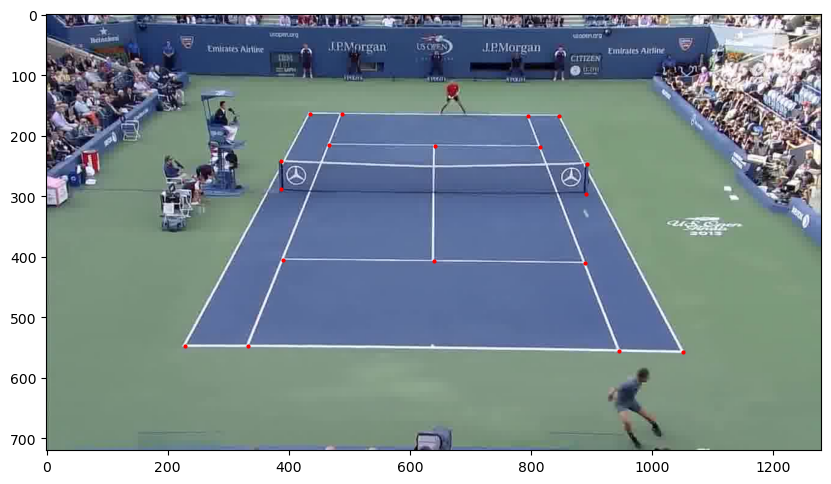

In [181]:
img_path = Path(local_img_folder)/'img_0900.jpg'
img = plt.imread(img_path)
_, ax = plt.subplots(figsize=(10,10))
plt.imshow(img)
plt.scatter(mod_kp[:,0], mod_kp[:,1], c='r', s=4, axes=ax)

DEBUG:root:line 1 end_pts: [386.77526857 403.57543946] [635.59423829 405.49841309]
DEBUG:root:line 2 end_pts: [387.00000001 288.00000001] [891.         296.00000001]
DEBUG:root:line 3 end_pts: [387.00000001 288.00000001] [329.3069375  403.13130096]
DEBUG:root:line 4 end_pts: [387.00000001 288.00000001] [387.00000001 242.00000001]
DEBUG:root:line 1 end_pts: [394.70367857 416.90138756] [630.67220722 418.53109991]
DEBUG:root:line 2 end_pts: [395.33907874 307.23202463] [872.69925814 314.44655592]
DEBUG:root:line 3 end_pts: [395.33907874 307.23202463] [340.19494318 416.52492397]
DEBUG:root:line 4 end_pts: [395.33907874 307.23202463] [395.50686265 263.65341628]
DEBUG:root:ank1: [21.12875796 37.82654533  0.        ]
DEBUG:root:ball1 3d: [ 38.54702357  37.82654533 -16.04116792]
DEBUG:root:ball2 3d: [ 2.00552132e+01  7.72434962e-15 -7.21127218e+00]
DEBUG:root:pt1_3d: [ 38.54702357  37.82654533 -16.04116792] pt2_3d: [ 2.00552132e+01  7.72434962e-15 -7.21127218e+00]


(array([    453.91854393,    -221.90172468,       0.        ,
        -109241.19798061]),
 (array([ 38.54702357,  37.82654533, -16.04116792]),
  array([ 2.00552132e+01,  7.72434962e-15, -7.21127218e+00])))

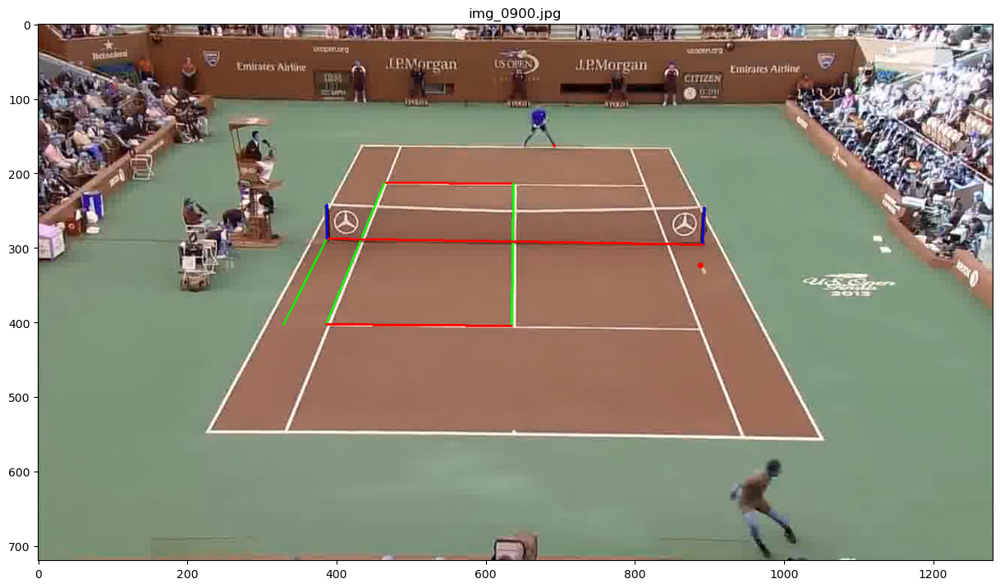

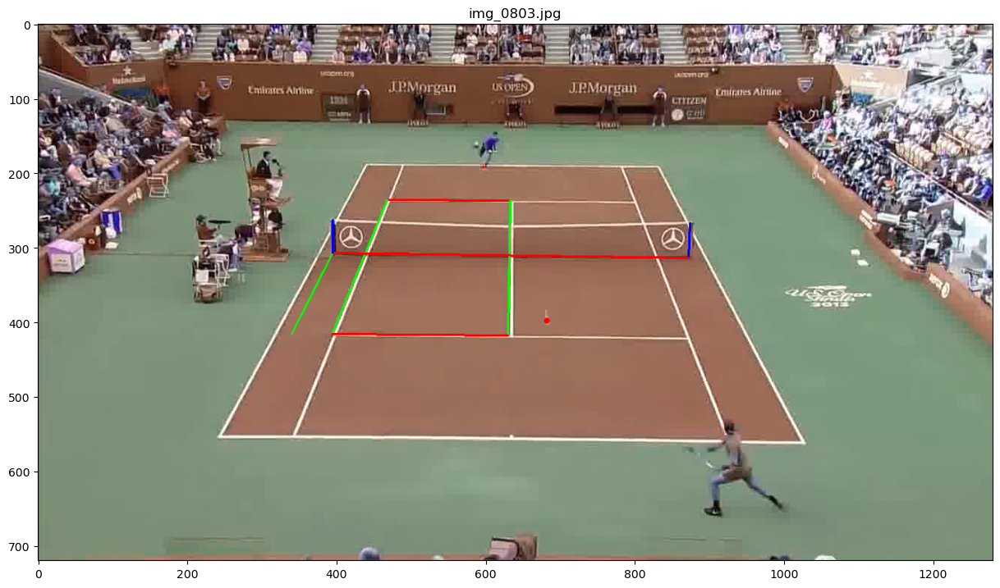

In [182]:
reset_logging()
logging.basicConfig(level=logging.DEBUG)

img_name1, img_name2 = ('img_0900.jpg', 'img_0803.jpg') 
#img_name1, img_name2 = ('img_12482.jpg', 'img_12495.jpg') 
P1, P2 = calculate_P(results_df, img_name1, plot_chart=True, figsize=(15,15)), calculate_P(results_df, img_name2, plot_chart=True, figsize=(15,15))
compute_plane_v2(results_df, img_name1, img_name2, P1, P2, f2_type='T')

In [183]:
def compute_2d_3d(df, img_name, serve_plane, P, t=None):
  row = df.loc[img_name]
  P_updated = np.concatenate([P.T, serve_plane.reshape(-1,1)], axis=1)
  P_updated_inv = np.linalg.inv(P_updated)
  ball_h_0 = np.array((*row[['x','y']].values*2,1,0)) if t is None else np.array(((*t,1,0)))
  vals = ball_h_0 @ P_updated_inv
  vals = vals/vals[-1]
  return np.around(vals[:-1]/12,3)

In [184]:
def y_dist(a,b):
  return np.abs(a[1]-b[1])

def x_dist(a,b):
  return np.abs(a[0]-b[0])

def xy_dist(a,b):
    return r2_dist(a,b,axis=0,nan_dim=1)

def ft_miles_hour(x, frames=1, fps=30):
  return x*0.000189394*fps*60*60/frames

def compute_speed(df, img_name1, img_name2, P1, P2, dist_func, sp, fps=30, frames=None):
    if not not_nan(sp): return np.nan
    if frames is None: frames = fname2int(img_name2) - fname2int(img_name1)
    pt1_2d, pt2_2d = df.loc[img_name1, ['x','y']].values*2, df.loc[img_name2, ['x','y']].values*2
    pt1, pt2 = compute_2d_3d_with_plane(pt1_2d, sp, P1), compute_2d_3d_with_plane(pt2_2d, sp, P2)
    logging.debug(f'{img_name1} {img_name2} {frames} {pt1} {pt2} {np.around(ft_miles_hour(dist_func(pt1, pt2), fps=fps, frames=frames),0)}')
    return np.around(ft_miles_hour(dist_func(pt1, pt2), fps=fps, frames=frames),0)


DEBUG:root:line 1 end_pts: [393.74055727 394.39349963] [639.81026465 396.4783375 ]
DEBUG:root:line 2 end_pts: [393.94195495 280.0082261 ] [892.97463588 288.15890206]
DEBUG:root:line 3 end_pts: [393.94195495 280.0082261 ] [336.95165455 393.91235282]
DEBUG:root:line 4 end_pts: [393.94195495 280.0082261 ] [393.93370591 234.44551112]
DEBUG:root:line 1 end_pts: [393.44358672 395.99360442] [639.56990969 397.99898217]
DEBUG:root:line 2 end_pts: [393.62394598 281.58298215] [892.60711291 289.62501073]
DEBUG:root:line 3 end_pts: [393.62394598 281.58298215] [336.62497396 395.53066011]
DEBUG:root:line 4 end_pts: [393.62394598 281.58298215] [393.60727759 236.01585597]
DEBUG:root:ank1: [ 12.6899328  -44.32118175   0.        ]
DEBUG:root:ball1 3d: [ 19.18889321 -44.32118175   3.31796386]
DEBUG:root:ball2 3d: [23.9315318  20.87902671  0.        ]
DEBUG:root:pt1_3d: [ 19.18889321 -44.32118175   3.31796386] pt2_3d: [23.9315318  20.87902671  0.        ]
DEBUG:root:img_1717.jpg img_1740.jpg 23 [ 19.189 -4

[-7.82402502e+02  5.69116631e+01  0.00000000e+00  2.10429963e+05] (array([ 19.18889321, -44.32118175,   3.31796386]), array([23.9315318 , 20.87902671,  0.        ])) 58.0
[ 4.92273509e+02  5.49316556e+01 -0.00000000e+00 -1.15822013e+05] (array([15.02901214, 41.02279243,  9.85950719]), array([1.96066501e+01, 6.68515885e-15, 2.73865093e-01])) 65.0


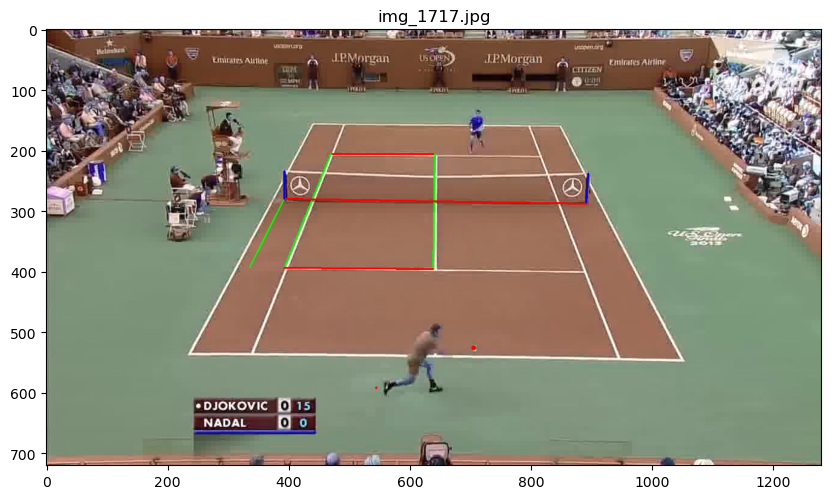

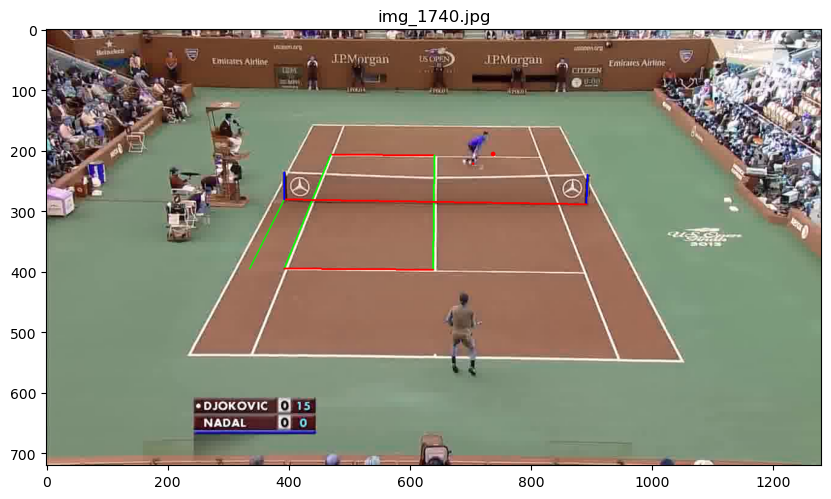

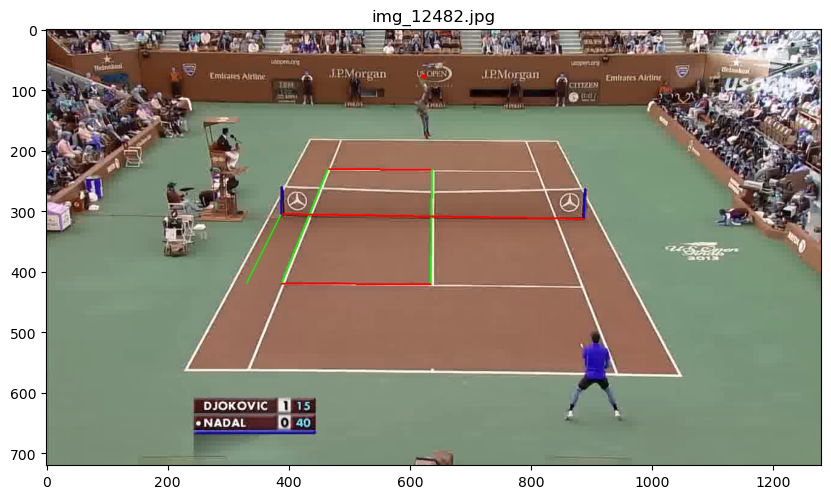

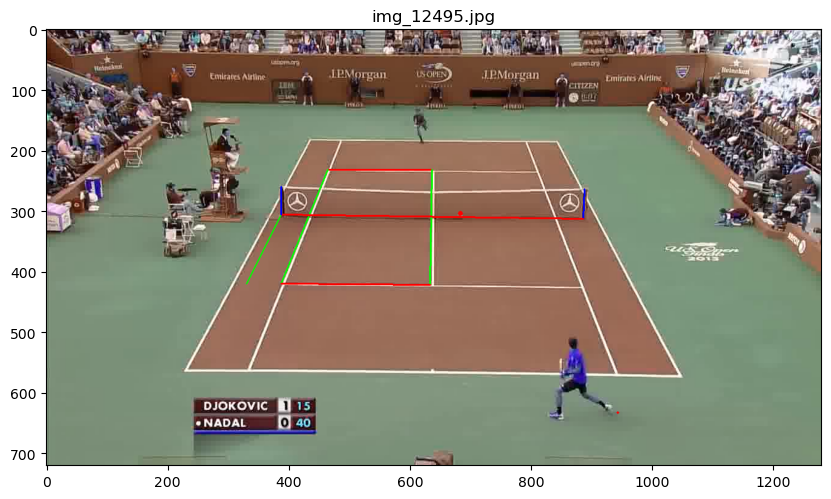

In [185]:
img_name1, img_name2 = ('img_1717.jpg', 'img_1740.jpg') 
P1, P2 = calculate_P(results_df, img_name1, plot_chart=True, figsize=(10,10)), calculate_P(results_df, img_name2, plot_chart=True, figsize=(10,10))
serve_plane, end_pts = compute_plane_v2(results_df, img_name1, img_name2, P1, P2)
print(serve_plane, end_pts, compute_speed(results_df, img_name1, img_name2, P1, P2, dist_func=y_dist, sp=serve_plane))


img_name1, img_name2 = ('img_12482.jpg', 'img_12495.jpg') 
P1, P2 = calculate_P(results_df, img_name1, plot_chart=True, figsize=(10,10)), calculate_P(results_df, img_name2, plot_chart=True, figsize=(10,10))
serve_plane, end_pts = compute_plane_v2(results_df, img_name1, img_name2, P1, P2, f2_type='T')
print(serve_plane, end_pts, compute_speed(results_df, img_name1, img_name2, P1, P2, dist_func=y_dist, sp=serve_plane))

In [186]:
# np.set_printoptions()
# np.set_printoptions(precision=1)
# np.set_printoptions(suppress=True)

In [187]:
def draw_line(img, p1, p2, ax, thickness=2):
              cv2.line(img, tuple(map(int,p1)), tuple(map(int,p2)), colors.get(ax), thickness)
colors = {'x': (255,0,0), 'y': (0,255,0), 'z': (0,0,255)} #red, green, blue

In [188]:
np.set_printoptions(precision=2)
np.set_printoptions(suppress=True)
P_v1 = calculate_P(results_df, img_name1)

DEBUG:root:line 1 end_pts: [407.   383.78] [637.7  385.55]
DEBUG:root:line 2 end_pts: [406.9 276.4] [874.72 283.79]
DEBUG:root:line 3 end_pts: [406.9 276.4] [353.72 383.37]
DEBUG:root:line 4 end_pts: [406.9 276.4] [406.78 233.6 ]
DEBUG:root:line 1 end_pts: [407.   383.78] [637.7  385.55]
DEBUG:root:line 2 end_pts: [406.9 276.4] [874.72 283.79]
DEBUG:root:line 3 end_pts: [406.9 276.4] [353.72 383.37]
DEBUG:root:line 4 end_pts: [406.9 276.4] [406.78 233.6 ]


P shape: (3, 4), real_3d_pts: (11, 4)
real_2d_pts: [[498. 157.   1.]
 [352. 514.   1.]
 [785. 158.   1.]
 [927. 521.   1.]
 [479. 204.   1.]
 [803. 205.   1.]
 [406. 381.   1.]
 [873. 384.   1.]
 [640. 205.   1.]
 [639. 382.   1.]
 [641. 158.   1.]]
P shape: (3, 4), real_3d_pts: (5, 4)
real_2d_pts: [[641. 130.   1.]
 [638. 463.   1.]
 [642. 102.   1.]
 [541. 177.   1.]
 [540. 209.   1.]]


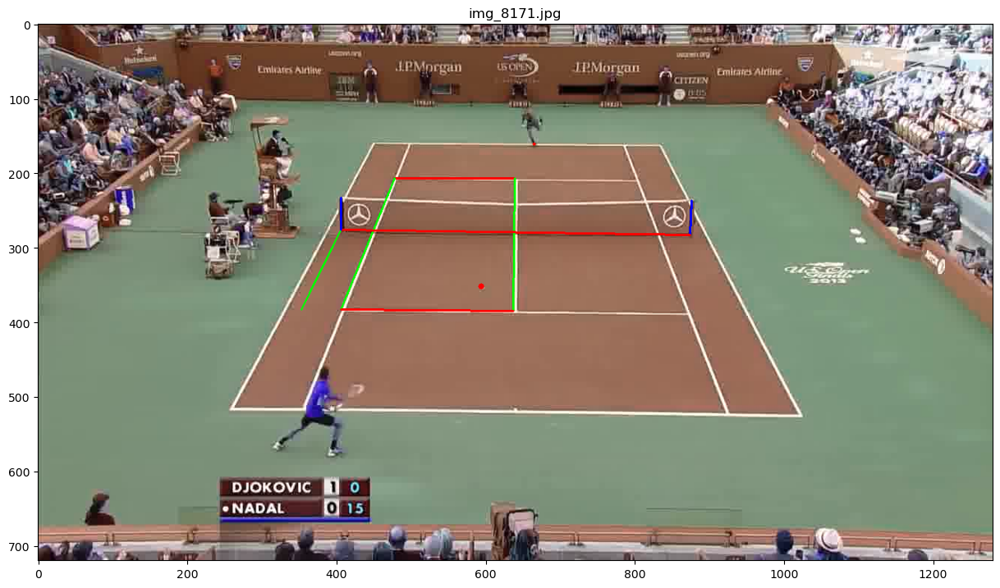

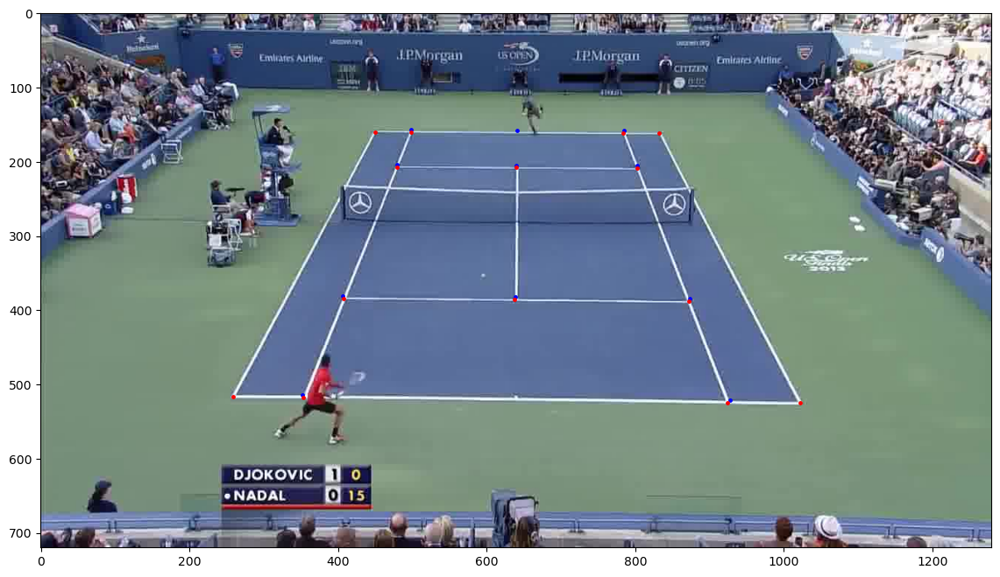

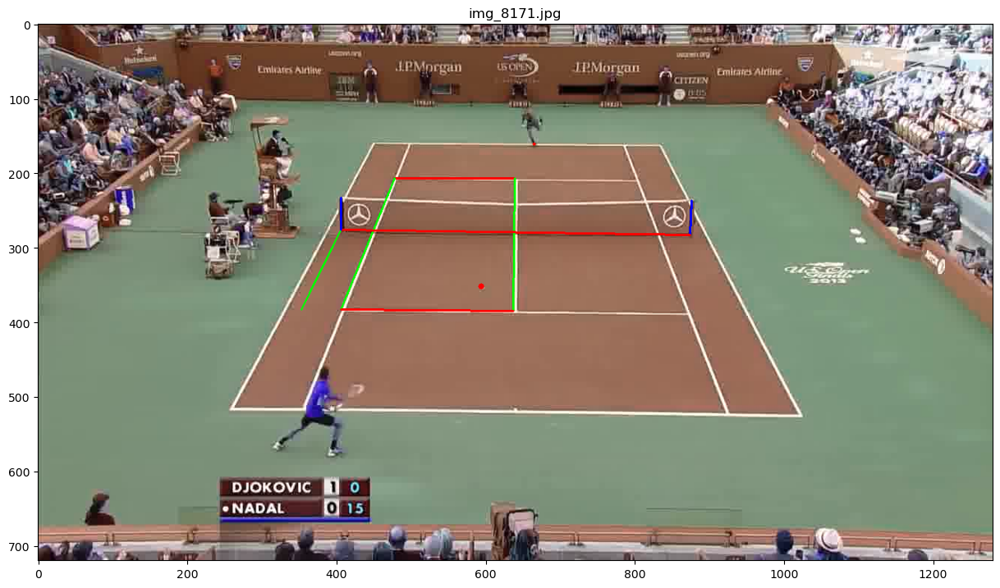

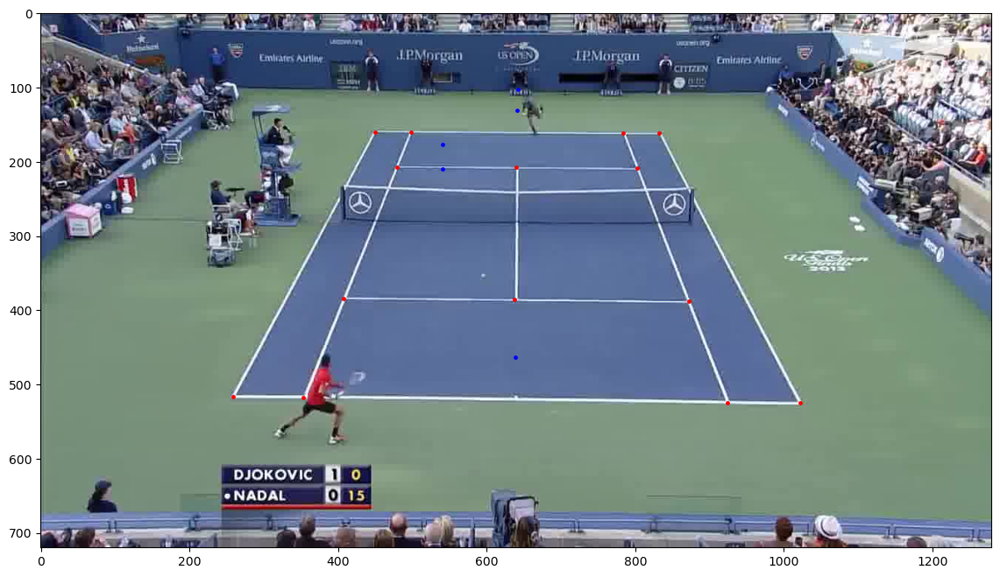

In [189]:

img_name1, img_name2 = ('img_0792.jpg', 'img_0803.jpg')
#img_name1, img_name2 = 'img_19151.jpg','img_19168.jpg'
img_name2 = 'img_8171.jpg'
real_court_kps =  np.array([
    [ 3*12,   39*12,  0,  1],       #4
    [ 3*12,  -39*12,  0,  1],       #5
    [30*12,   39*12,  0,  1],       #6
    [30*12,  -39*12,  0,  1],       #7
    [ 3*12,   21*12,  0,  1],       #8
    [30*12,   21*12,  0,  1],       #9
    [ 3*12,  -21*12,  0,  1],       #10
    [30*12,  -21*12,  0,  1],       #11
    [16.5*12, 21*12,  0,  1],       #12
    [16.5*12,-21*12,  0,  1],       #13
    [16.5*12, 39*12,  0,  1],      #test
])

real_net_pts = np.array([
    [(3+13.5)*12,  39*12, 3*12, 1],       #center of net, farther baseline, net height
    [(3+13.5)*12, -39*12, 3*12, 1],       #center of net, closer baseline, net height
    [(3+13.5)*12,  39*12, 3*12*2, 1],     #center of net, farther baseline, 2x net
    [(3+13.5)*12//2, 39*12//2, 3*12, 1],  #quarter net, half way to farther baseline, net height
    [(3+13.5)*12//2, 39*12//2, 0, 1],     #quarter net, half way to farther baseline, floor
])


def validate_P_courtkp(df, f, real_3d_pts=real_court_kps, ax=None, plot_chart=True):
    P = calculate_P(df, f, plot_chart=True, figsize=(15,15))
    court_kps = df.loc[f].kp.squeeze()
    print(f'P shape: {P.shape}, real_3d_pts: {real_3d_pts.shape}')
    real_2d_pts = real_3d_pts @ P.T
    real_2d_pts = np.around(real_2d_pts/real_2d_pts[:,2:])
    print(f'real_2d_pts: {real_2d_pts}')
    if not ax: _, ax = plt.subplots(figsize=(14,8))
    img = cv2.imread(str(IMG_FOLDER/f))
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), alpha=1)
    ax.scatter(real_2d_pts[:,0], real_2d_pts[:,1],s=6, color='b')
    ax.scatter(court_kps[:,0], court_kps[:,1],s=6, color='r')
    
validate_P_courtkp(results_df, img_name2, real_3d_pts=real_court_kps)
validate_P_courtkp(results_df, img_name2, real_3d_pts=real_net_pts)

DEBUG:root:line 1 end_pts: [384.92 428.15] [634.94 429.91]
DEBUG:root:line 2 end_pts: [385.38 312.07] [891.17 319.76]
DEBUG:root:line 3 end_pts: [385.38 312.07] [327.18 427.74]
DEBUG:root:line 4 end_pts: [385.38 312.07] [385.47 265.94]
DEBUG:root:line 1 end_pts: [385.14 428.23] [635.25 429.96]
DEBUG:root:line 2 end_pts: [385.56 312.08] [891.34 319.77]
DEBUG:root:line 3 end_pts: [385.56 312.08] [327.35 427.84]
DEBUG:root:line 4 end_pts: [385.56 312.08] [385.63 265.94]
DEBUG:root:ank1: [ 13.89 -39.07   0.  ]
DEBUG:root:ball1 3d: [ 13.32 -39.07  11.23]
DEBUG:root:ball2 3d: [19.23 18.15  0.  ]
DEBUG:root:pt1_3d: [ 13.32 -39.07  11.23] pt2_3d: [19.23 18.15  0.  ]
DEBUG:root:img_19151.jpg img_19168.jpg 17 [ 13.32 -39.07  11.23] [19.23 18.15  0.  ] 69.0


69.0

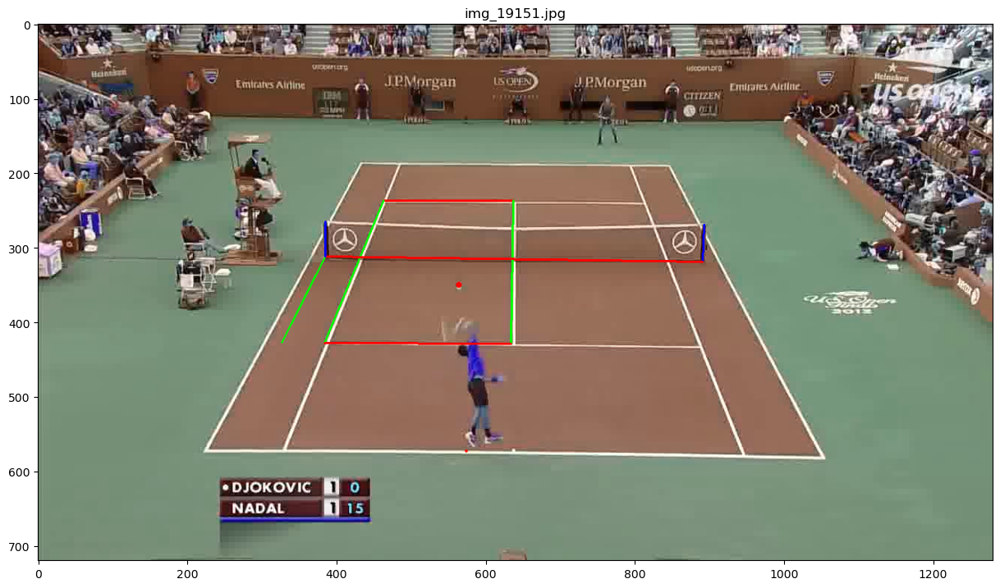

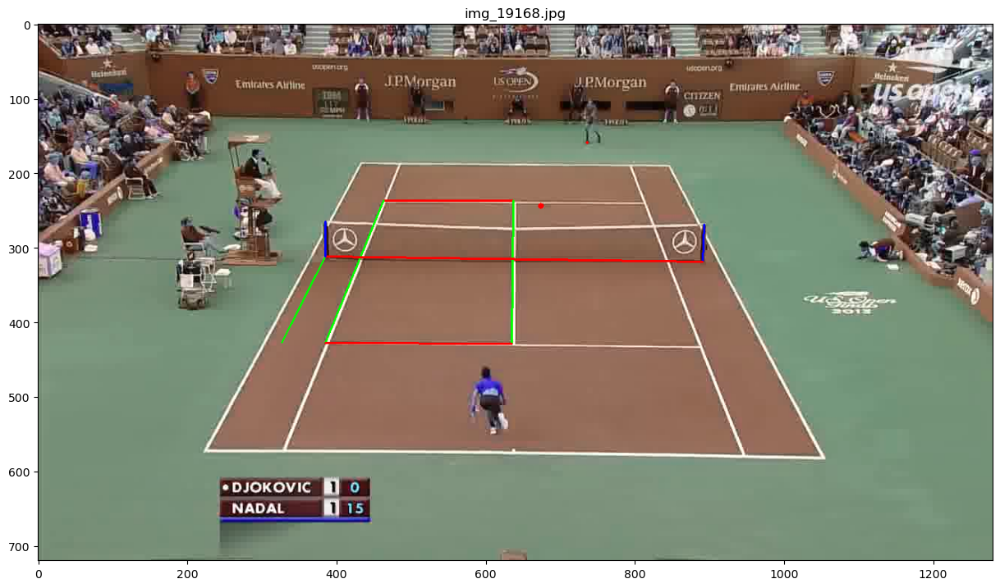

In [190]:
img_name1, img_name2 = ('img_0792.jpg', 'img_0803.jpg') 
img_name1, img_name2 = 'img_9225.jpg','img_9238.jpg'
img_name1, img_name2 = 'img_8158.jpg','img_8171.jpg'
img_name1, img_name2 = 'img_17618.jpg','img_17633.jpg'
img_name1, img_name2 = 'img_19151.jpg','img_19168.jpg'
P1, P2 = calculate_P(results_df, img_name1, plot_chart=True, figsize=(15,15)), calculate_P(results_df, img_name2, plot_chart=True, figsize=(15,15))
serve_plane,_ = compute_plane_v2(results_df, img_name1, img_name2, P1, P2)
compute_speed(results_df, img_name1, img_name2, P1, P2, dist_func=y_dist, sp=serve_plane)

In [191]:
def compute_max_speed_v2(df, img_name1, img_name2, f1_offsets=4, dist_func=y_dist, plot_chart=False, f2_type='B', ret_ends=False):
    P1, P2 = calculate_P(df, img_name1, plot_chart=False), calculate_P(df, img_name2, plot_chart=plot_chart)
    serve_plane, end_pts = compute_plane_v2(df, img_name1, img_name2, P1, P2, f2_type=f2_type)
    if np.isnan(serve_plane).any(): return (np.nan,np.nan) if not ret_ends else (np.nan, np.nan),(np.nan, np.nan)
    serve_s = compute_speed(df, img_name1, img_name2, P1, P2, dist_func=dist_func, sp=serve_plane)
    all_s = []
    slice_df = df.loc[img_name1:img_name2]
    all_fs = slice_df[(slice_df.x.notna()) & (slice_df.y.notna())].index.values[:f1_offsets]
    logging.debug(f'all_fs: {all_fs}')
    speed_dict = {}
    for f1 in all_fs:
        f2 = img_name2
        P1, P2 = calculate_P(df, f1, plot_chart=plot_chart), calculate_P(df, f2, plot_chart=False)
        s_avg = compute_speed(df, f1, f2, P1, P2, dist_func=dist_func, sp=serve_plane)
        n_frames = fname2int(f2)-fname2int(f1)
        s_ini = s_avg + n_frames*(n_frames-1)/2 * 0.2
        s_ini = s_avg + (n_frames-1)/2 * (s_avg**2) * 3.5e-4
        speed_dict[(f1,f2)] = s_ini
        #print(f'{f1} {f2} {n_frames} {s_avg} {s_ini}')
    logging.debug(f'speed_dict: {sorted(speed_dict.items(), key=lambda item: item[1], reverse=True)}')

    first_item, second_item =  sorted(speed_dict.items(), key=lambda item: item[1], reverse=True)[0],  sorted(speed_dict.items(), key=lambda item: item[1], reverse=True)[1]
#    if first_item[1]/second_item[1]>1.15:
    if first_item[1]>140:
        print(f'first item corrupted. {first_item[1]} {second_item[1]}')
        return second_item if (not ret_ends) else (second_item, end_pts)
    else:
        return first_item if (not ret_ends) else (first_item, end_pts)

img_name1, img_name2, f_type = 'img_28165.jpg', 'img_28180.jpg', 'T'

compute_max_speed_v2(results_df, img_name1, img_name2, f1_offsets=4, plot_chart=False, f2_type=f_type, ret_ends=True)

DEBUG:root:ank1: [ 19.3  -38.54   0.  ]
DEBUG:root:ball1 3d: [ 18.28 -38.54  10.68]
DEBUG:root:ball2 3d: [7.69 0.   4.67]
DEBUG:root:pt1_3d: [ 18.28 -38.54  10.68] pt2_3d: [7.69 0.   4.67]
DEBUG:root:img_28165.jpg img_28180.jpg 15 [ 18.28 -38.54  10.68] [7.69 0.   4.67] 53.0
DEBUG:root:all_fs: ['img_28165.jpg' 'img_28166.jpg' 'img_28167.jpg' 'img_28168.jpg']
DEBUG:root:img_28165.jpg img_28180.jpg 15 [ 18.28 -38.54  10.68] [7.69 0.   4.67] 53.0
DEBUG:root:img_28166.jpg img_28180.jpg 14 [ 17.21 -34.65  10.2 ] [7.69 0.   4.67] 51.0
DEBUG:root:img_28167.jpg img_28180.jpg 13 [ 16.11 -30.66   9.88] [7.69 0.   4.67] 48.0
DEBUG:root:img_28168.jpg img_28180.jpg 12 [ 15.01 -26.63   9.31] [7.69 0.   4.67] 45.0
DEBUG:root:speed_dict: [(('img_28165.jpg', 'img_28180.jpg'), 59.88205), (('img_28166.jpg', 'img_28180.jpg'), 56.917275000000004), (('img_28167.jpg', 'img_28180.jpg'), 52.8384), (('img_28168.jpg', 'img_28180.jpg'), 48.898125)]


((('img_28165.jpg', 'img_28180.jpg'), 59.88205),
 (array([ 18.28, -38.54,  10.68]), array([7.69, 0.  , 4.67])))

In [332]:
def gen_points_df(final_pts_dict):
    rows = []
    for clip_num, pt_tups in final_w_bounce_pts.items():
        for pt_idx, pt_tup in enumerate(pt_tups):
            for s_t in pt_tup:
                shot = tuple_shot(s_t, plot_chart=False)
                rows.append([clip_num, pt_idx, *s_t, shot])
    return pd.DataFrame(rows, columns=['clip_num', 'pt_idx', 'img_name', 'side', 'return_type', 'shot_type'])
points_df = gen_points_df(final_w_bounce_pts)

nan
nan


In [333]:
# rows = []
# for clip_num, pt_tups in final_w_bounce_pts.items():
#     for pt_idx, pt_tup in enumerate(pt_tups):
#         for s_t in pt_tup:
#             shot = tuple_shot(s_t, plot_chart=False)
#             rows.append([clip_num, pt_idx, *s_t, shot])
# points_df = pd.DataFrame(rows, columns=['clip_num', 'pt_idx', 'img_name', 'side', 'return_type', 'shot_type'])
# points_df.head(2)

#validation that F/N are followed by side==B or return_type==T or shot_type==S
def validate_points_df(points_df):
    for clip_num in sorted(points_df.clip_num.value_counts().index.values):
        points_clip_df = filter_clip(points_df, clip_num).reset_index(drop=True)
        for idx, row in points_clip_df.iterrows():
            if idx==len(points_clip_df)-1: break
            next_row = points_clip_df.iloc[idx+1]
            if (row.side in ('N','F')) and not ((next_row.side in ('B')) or next_row.return_type in ('T') or next_row.shot_type in ('S')):
                raise Exception(f"Points df validation failed - clip:{clip_num} {idx} {len(points_clip_df)} {row.img_name,row.side} {next_row.img_name,next_row.side}")
validate_points_df(points_df)

In [303]:

points_df.loc[points_df.img_name=='img_45042.jpg',['img_name']] = 'img_45030.jpg'
points_df.loc[points_df.img_name=='img_53069.jpg',['img_name']] = 'img_53065.jpg'
points_df.loc[points_df.img_name=='img_1699.jpg','img_name'] = 'img_1705.jpg'
points_df.loc[points_df.img_name=='img_4368.jpg','img_name'] = 'img_4377.jpg'
points_df.loc[points_df.img_name=='img_7145.jpg','img_name'] = 'img_7148.jpg'
points_df.loc[points_df.img_name=='img_5603.jpg',['img_name','side','return_type']] = ['img_5662.jpg','B','B']
points_df.loc[points_df.img_name=='img_5647.jpg',['img_name','side','return_type']] = ['img_5670.jpg','F','E']
points_df.loc[points_df.img_name=='img_12495.jpg','img_name'] = 'img_12491.jpg'
points_df.loc[points_df.img_name=='img_4556.jpg','img_name'] = 'img_4553.jpg'
points_df.loc[points_df.img_name=='img_18002.jpg','img_name'] = 'img_17987.jpg'
points_df.loc[points_df.img_name=='img_23292.jpg','img_name'] = 'img_23290.jpg'
points_df.loc[points_df.img_name=='img_21023.jpg','img_name'] = 'img_21009.jpg'
points_df.loc[points_df.img_name=='img_21023.jpg','img_name'] = 'img_21009.jpg'
points_df.loc[points_df.img_name=='img_39662.jpg','img_name'] = 'img_39674.jpg'
points_df.loc[points_df.img_name=='img_51312.jpg','img_name'] = 'img_51240.jpg'
points_df.loc[points_df.img_name=='img_51212.jpg','img_name'] = 'img_51232.jpg'
points_df.loc[points_df.img_name=='img_55488.jpg','img_name'] = 'img_55491.jpg'
points_df.loc[points_df.img_name=='img_61010.jpg','img_name'] = 'img_60962.jpg'
points_df.loc[points_df.img_name=='img_66634.jpg','img_name'] = 'img_66627.jpg'
points_df.loc[points_df.img_name=='img_67764.jpg','img_name'] = 'img_67797.jpg'
points_df.loc[points_df.img_name=='img_67775.jpg','img_name'] = 'img_67810.jpg'
points_df.loc[points_df.img_name=='img_68730.jpg','img_name'] = 'img_68747.jpg'
points_df.loc[points_df.img_name=='img_68747.jpg','img_name'] = 'img_68762.jpg'
points_df.loc[points_df.img_name=='img_74126.jpg','img_name'] = 'img_74121.jpg'
points_df.loc[points_df.img_name=='img_75252.jpg','img_name'] = 'img_75260.jpg'
points_df.loc[points_df.img_name=='img_77235.jpg','img_name'] = 'img_77236.jpg'
points_df.loc[points_df.img_name=='img_78784.jpg','img_name'] = 'img_78780.jpg'
points_df.loc[points_df.img_name== 'img_81291.jpg','img_name'] = 'img_81280.jpg'
points_df.loc[points_df.img_name== 'img_81358.jpg','img_name'] = 'img_81372.jpg'
points_df.loc[points_df.img_name== 'img_82748.jpg','img_name'] = 'img_82763.jpg'
points_df.loc[points_df.img_name== 'img_94604.jpg','img_name'] = 'img_94605.jpg'
points_df.loc[points_df.img_name== 'img_96901.jpg','img_name'] = 'img_96892.jpg'
points_df.loc[points_df.img_name== 'img_102776.jpg','img_name'] = 'img_102781.jpg'
points_df.loc[points_df.img_name== 'img_99766.jpg','img_name'] = 'img_99773.jpg'

points_df.loc[points_df.img_name=='img_8400.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name=='img_7383.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name=='img_33032.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name=='img_33447.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name=='img_37290.jpg','return_type'] = 'T'
points_df.loc[points_df.img_name=='img_70144.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name=='img_85240.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name=='img_102781.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name=='img_104386.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name=='img_74121.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name=='img_45554.jpg','return_type'] = 'R'

results_df.loc['img_97821.jpg',['x','y']] = [381,90] #clip 91 push ball out
results_df.loc['img_59764.jpg',['x','y']] = [380,90] #clip 91 push ball out



for drop_f in ('img_1728.jpg','img_7414.jpg','img_8425.jpg','img_8495.jpg','img_8498.jpg','img_20980.jpg', 'img_33476.jpg','img_33495.jpg','img_43486.jpg','img_43511.jpg','img_43528.jpg','img_45645.jpg','img_55546.jpg','img_55628.jpg',
               'img_55688.jpg','img_70170.jpg','img_70636.jpg',*points_df[points_df.clip_num==143].img_name.values,*points_df[points_df.clip_num==145].img_name.values, 'img_85264.jpg','img_85326.jpg','img_95967.jpg','img_102817.jpg','img_102887.jpg'
              ,'img_104407.jpg','img_104481.jpg', *points_df[points_df.clip_num==210].img_name.values,'img_103927.jpg','img_103930.jpg','img_74184.jpg'):
    drop_idx = points_df[points_df.img_name==drop_f].index
    points_df.drop(drop_idx, inplace=True)

In [334]:
def drop_df_overrides(override_file, df):
    with open(override_file, 'r') as file:
        for line in file:
            line = line.strip()
            if line.startswith('clip'): drop_idx = df[df.clip_num==int(line.split('_')[1])].index
            else: drop_idx = df[df.img_name==str(line)].index
            df.drop(drop_idx, inplace=True)

In [335]:
drop_df_overrides('../points_drop.csv', points_df)

In [336]:
#validation that F/N are followed by side==B or return_type==T or shot_type==S
for clip_num in sorted(points_df.clip_num.value_counts().index.values):
    points_clip_df = filter_clip(points_df, clip_num).reset_index(drop=True)
    for idx, row in points_clip_df.iterrows():
        if idx==len(points_clip_df)-1: break
        next_row = points_clip_df.iloc[idx+1]
        if (row.side in ('N','F')) and not ((next_row.side in ('B')) or next_row.return_type in ('T') or next_row.shot_type in ('S')):
            print(f'clip:{clip_num} {idx} {len(points_clip_df)} {row.img_name,row.side} {next_row.img_name,next_row.side}')
 

clip:1 6 10 ('img_1717.jpg', 'N') ('img_1740.jpg', 'F')
clip:49 13 17 ('img_20957.jpg', 'F') ('img_20990.jpg', 'N')
clip:67 11 13 ('img_33447.jpg', 'N') ('img_33491.jpg', 'F')
clip:87 6 18 ('img_55534.jpg', 'F') ('img_55553.jpg', 'N')
clip:87 9 18 ('img_55588.jpg', 'F') ('img_55644.jpg', 'N')
clip:87 12 18 ('img_55671.jpg', 'F') ('img_55694.jpg', 'N')
clip:110 6 8 ('img_70144.jpg', 'F') ('img_70196.jpg', 'N')
clip:195 26 30 ('img_95933.jpg', 'F') ('img_95968.jpg', 'N')


In [337]:
validate_speed_fs = []
for idx, row in points_df.iterrows():
    if row.shot_type=='S':
       f1, f2 = row.img_name, points_df.iloc[idx+1].img_name
       validate_speed_fs.append(f"img_name1, img_name2 = '{f1}','{f2}'")
#serve_speed_gt = defaultdict(int)

In [338]:
serve_speed_gt = defaultdict(int)
serve_speed_gt[0] = 121,('F','St') #120
serve_speed_gt[1] = 98,('F','Si')  #101
serve_speed_gt[2] = 108,('F','Si') #104
serve_speed_gt[3] = 113,('F','St') #109
serve_speed_gt[4] = 110,('F','St') #107
serve_speed_gt[5] = 120,('F','St') #110
serve_speed_gt[6] = 119,('F','Si') #117 
serve_speed_gt[7] = 122,('F','B')  #138
serve_speed_gt[8] = 119,('F','T')  #
serve_speed_gt[9] = 87,('F','Si')  #98
serve_speed_gt[10] = 122,('F','T') #
serve_speed_gt[11] = 93, ('F','B') #99
serve_speed_gt[12] = 114,('F','Si')#107
serve_speed_gt[13] = 115,('F','B') #110
serve_speed_gt[14] = 123,('N','St')#120
serve_speed_gt[15] = 88,('N','St') #97
serve_speed_gt[16] = 117,('N','T') #
serve_speed_gt[17] = 89,('N','St') #99
serve_speed_gt[18] = 123,('N','St')# 118
serve_speed_gt[19] = 98,('N','T') # net, speed not recorded
serve_speed_gt[20] = 91,('N','B') #97
serve_speed_gt[21] = 115,('N','T') #net
serve_speed_gt[22] = 111,('N','Si')#109
serve_speed_gt[23] = 118,('N','St')#121
serve_speed_gt[24] = 93,('N','B')  #98
serve_speed_gt[25] = 111,('N','Si')#107
serve_speed_gt[26] = 119,('N','Si')#112
serve_speed_gt[27] = 107,('N','T') #
serve_speed_gt[28] = 93,('N','Si') #102
serve_speed_gt[29] = 123,('N','Si')#116
serve_speed_gt[30] = 109,('N','Si')#112
serve_speed_gt[31] = 112,('N','B') #111
serve_speed_gt[32] = 107,('N','T') #119
serve_speed_gt[33] = 79,('N','St') #
serve_speed_gt[34] = 110,('N','T')
serve_speed_gt[35] = 84,('N','B')
serve_speed_gt[36] = 119,('N','T')
serve_speed_gt[37] = 87,('N','B')
serve_speed_gt[38] = 112,('N','Si')
serve_speed_gt[39] = 111 ,('N','St')
serve_speed_gt[40] = 107,('N','Si')
serve_speed_gt[41] = 110,('F','St')
serve_speed_gt[42] = 120,('F','St')
serve_speed_gt[43] = 90,('F','Si')
serve_speed_gt[44] = 111,('F','Si')
serve_speed_gt[45] = 116,('F','T')
serve_speed_gt[46] = 87,('F','B')
serve_speed_gt[47] = 119,('F','St')
serve_speed_gt[48] = 113,('F','T')
serve_speed_gt[49] = 85,('F','B')
serve_speed_gt[50] = 121,('F','St')


In [339]:
reset_logging()
configure_logging(False)
count = -1
all_errors = []
for idx, row in points_df.iterrows():
    if row.shot_type=='S':
        count += 1 
        f1, f2, s1_ty, s2_ty, s1_r, s2_r = row.img_name, points_df.iloc[idx+1].img_name, row.shot_type, points_df.iloc[idx+1].shot_type, row.return_type, points_df.iloc[idx+1].return_type
        #print(f'{f1} {f2} {s1_ty} {s2_ty} {s1_r} {s2_r}')
        try:
            f, max_s= compute_max_speed_v2(results_df, f1, f2, f1_offsets=6, plot_chart=False)
        except:
            print(f'failed {f1} {f2}')
            continue
        error = (max_s/serve_speed_gt[count][0]-1)*100 if count<51  else np.nan
        print(f'{count} {f1}:{f2} {s2_r} - {max_s} {serve_speed_gt[count]} {error: 0.2f}')#{speed_r:0.1f}')
        #if s2_r!='T': all_errors.append(error)
        if count<51 and (serve_speed_gt[count][1][1]!='T' and s2_r!='T'): all_errors.append(error)
        

0 img_0792.jpg:img_0803.jpg B - 131.175 (121, ('F', 'St'))  8.41
1 img_1608.jpg:img_1622.jpg B - 98.672475 (98, ('F', 'Si'))  0.69
2 img_5395.jpg:img_5421.jpg R - 77.279375 (108, ('F', 'Si')) -28.45
3 img_6325.jpg:img_6344.jpg E - 103.965625 (113, ('F', 'St')) -8.00
4 img_7145.jpg:img_7173.jpg R - 81.2032 (110, ('F', 'St')) -26.18
5 img_8158.jpg:img_8210.jpg B - 14.212575 (120, ('F', 'St')) -88.16
6 img_9225.jpg:img_10830.jpg R - 5.51685 (119, ('F', 'Si')) -95.36
7 img_10811.jpg:img_10898.jpg B - 50.3863 (122, ('F', 'B')) -58.70
8 img_12482.jpg:img_12891.jpg B - 1.0714 (119, ('F', 'T')) -99.10
9 img_12843.jpg:img_13881.jpg S - 1.181475 (87, ('F', 'Si')) -98.64
10 img_13881.jpg:img_14349.jpg B - 1.081725 (122, ('F', 'T')) -99.11
11 img_14303.jpg:img_14386.jpg B - 43.949475 (93, ('F', 'B')) -52.74
12 img_15439.jpg:img_16228.jpg S - 6.1896 (114, ('F', 'Si')) -94.57
13 img_16228.jpg:img_16310.jpg B - 39.890950000000004 (115, ('F', 'B')) -65.31
14 img_17297.jpg:img_17654.jpg R - 10.0527 (12

In [340]:
import numpy.linalg as LA
def compute_heels_3d(row, col='n_heels', df=results_df):
    f = row.img_name
    if check_nan(df.loc[f,col]): return np.array([np.nan, np.nan, np.nan])
    heels_2d = df.loc[f,col].mean(axis=0)
    heels_2d = max(df.loc[f,col], key=lambda x: x[1]) if col=='f_heels' else (min(df.loc[f,col], key=lambda x: x[1]) if col=='n_heels' else np.nan)
    P = calculate_P(df, f)
    heels_3d = np.array([*heels_2d,1]) @ LA.inv(P.T[[0,1,3]])
    heels_3d = np.around(np.array([*heels_3d[:2]/heels_3d[-1],0])/12,1)
    logging.debug(f'f: {f} heels_2d: {heels_2d} heels_3d: {heels_3d}')
    return heels_3d

In [341]:
def compute_hit_angle(pt1, pt2, side):
    if check_nan(pt1) or check_nan(pt2): return np.nan
    hit_v = pt2 - pt1
    y_axis = np.array([0, 1, 0])
    #logger.debug(f'dot: {np.dot(hit_v, y_axis)}, mod: {np.sqrt(np.sum(hit_v**2))} arccos: {np.arccos( np.dot(hit_v, y_axis) / np.sqrt(np.sum(hit_v**2)) )}')
    theta = np.degrees( np.arccos( np.dot(hit_v, y_axis) / np.sqrt(np.sum(hit_v**2)) ) )
    #print(f'pts: {pt1} {pt2} hit_v: {hit_v} y_axis: {y_axis} theta: {theta}')
    theta = 180-theta if theta>90 else theta
    theta = theta if ((hit_v[0]>0 and side=='N')|(hit_v[0]<0 and side=='F')) else -theta 
    return theta 

In [342]:
def assign_results(df):
    for idx,row in df.iterrows():
        prev_idx = df.index[df.index.get_loc(idx)-1]
        if row.return_type in ('T'):
            df.loc[idx,'result'] = 'L'
            df.loc[prev_idx,'result'] = 'W'
        elif row.return_type in ('E'):
            if row.shot_type=='S':
                cond1 = (row.ball_3d[0]<=16.5 and row.ball_3d_f1[0]>=16.5 and row.ball_3d_f1[0]<=30)
                cond2 = (row.ball_3d[0]>16.5 and row.ball_3d_f1[0]<=16.5 and row.ball_3d_f1[0]>=3)
                cond3 = row.b2bl>=18
                logging.debug(f'cond1 {cond1}  cond2 {cond2} cond3 {cond3}')
                if (cond1 or cond2) and cond3:
                    logging.debug(f'entered S and inside 1')
                    df.loc[idx,'result'] = 'W'
                    df.loc[prev_idx,'result'] = 'L'
                else:
                    logging.debug(f'entered S and inside 2')
                    df.loc[idx,'result'] = 'L'
                    df.loc[prev_idx,'result'] = 'W'
            elif (row.shot_type!='S') and (row.b2sl<0 or row.b2bl<0):
                logging.debug(f'entered S and inside 3')
                df.loc[idx,'result'] = 'L'
                df.loc[prev_idx,'result'] = 'W'
            elif (row.shot_type!='S') and (row.b2sl>=0 and row.b2bl>=0):
                logging.debug(f'not S and inside 3')
                df.loc[idx,'result'] = 'W'
                df.loc[prev_idx,'result'] = 'L'
        elif row.return_type in ('R'):
            df.loc[idx,'result'] = 'R'
        else:
            df.loc[idx,'result'] = 'O'
            

In [343]:
def gen_point_attribs(point_df, clip_num, df=results_df):
    point_clip_df = filter_clip(points_df, clip_num).reset_index(drop=True)
    point_clip_df['f_heels'] = point_clip_df.apply(lambda row: compute_heels_3d(row, col='f_heels'), axis=1)
    point_clip_df['n_heels'] = point_clip_df.apply(lambda row: compute_heels_3d(row, col='n_heels'), axis=1)
    all_rows = []
    for idx, row in point_clip_df.iterrows():
        row['player'] = df.loc[row.img_name].f_p if row.side=='F' else (df.loc[row.img_name].n_p if row.side=='N' else np.nan)
        next_row = point_clip_df.iloc[idx+1] if idx<len(point_clip_df)-1 else pd.Series(np.nan, index=row.index)
        logging.debug(f'next row: {row.img_name} {next_row.img_name}')
        if row.side in ('N','F') and type(next_row.img_name) is str:
            #print(f'idx: {idx} {row.img_name} {next_row.img_name}')
            #next_bounce =  True if next_row.side=='B' else False
            f2_type = 'T' if next_row.return_type=='T' else next_row.side
            (_, x_max_s), _ = compute_max_speed_v2(df, row.img_name, next_row.img_name, f1_offsets=6, dist_func=x_dist, plot_chart=False, f2_type=f2_type, ret_ends=True)
            (_, y_max_s), end_pts = compute_max_speed_v2(df, row.img_name, next_row.img_name, f1_offsets=6, dist_func=y_dist, plot_chart=False, f2_type=f2_type, ret_ends=True)
            if x_max_s>40 or y_max_s>150: print('Out of range speed')
            row['x_speed'] = round(x_max_s) if not np.isnan(x_max_s) and x_max_s<40 else np.nan
            row['y_speed'] = round(y_max_s) if not np.isnan(y_max_s) and y_max_s<150 else np.nan
            end_pts = np.around(end_pts,1) if (not check_nan(end_pts[0]) and not check_nan(end_pts[1])) else (np.nan, np.nan)
            #print(f'end_pts: {end_pts}')
            row['ball_3d'], next_pt = end_pts
            row['ball_3d_f1'] = next_pt
            cur_heels, opp_heels = (row.n_heels, row.f_heels) if row.side=='N' else (row.f_heels, row.n_heels)     
            row['hh2c'], row['hh2n'] = (16.5 - cur_heels[0],  -cur_heels[1]) if row.side=='N' else (-16.5 + cur_heels[0],  cur_heels[1]) #hit heels to center line
            row['oh2c'], row['oh2n'] = (16.5 - opp_heels[0],  -opp_heels[1]) if neg_side(row.side)=='N' else (-16.5 + opp_heels[0],  opp_heels[1]) #oppsite heels to center line
            row['r2b_theta'] = np.around(compute_hit_angle(row['ball_3d'], next_pt, row.side),1) #return to bounce theta 
            row['r2h_theta'] = np.around(compute_hit_angle(row['ball_3d'], opp_heels, row.side),1)
            #print(f"{opp_heels} {row['r2b_theta']} {row['r2h_theta']}")
            if next_row.side=='B' and not check_nan(next_pt):
                logging.debug(f'next_pt: {next_pt}, opp_heels: {opp_heels}')
                row['b2sl'], row['b2bl'] = min(next_pt[0]-3, 30-next_pt[0]), 39-(-next_pt[1] if neg_side(row.side)=='N' else next_pt[1])
                row['b2h_x'], row['b2h_y'], _ = (next_pt - opp_heels) if neg_side(row.side)=='N' else -(next_pt - opp_heels) # bounce in current frame to opposite player heels in current frame
                if row.img_name in ('img_8348.jpg'): row.b2sl = -1*row.b2sl
                prev_row = point_clip_df.iloc[max(idx-2,0):idx][point_clip_df.side==neg_side(row.side)]
                if prev_row.shape[0]>0:
                    prev_opp_heels = prev_row.n_heels.values[0] if neg_side(row.side)=='N' else prev_row.f_heels.values[0]
                    #print(f' prev row {prev_row.n_heels} prev {prev_opp_heels}')
                    row['r2ph_theta'] = np.around(compute_hit_angle(row['ball_3d'], prev_opp_heels, row.side),1)
                    row['b2ph_x'], row['b2ph_y'], _ = (next_pt - prev_opp_heels)  if neg_side(row.side)=='N' else -(next_pt - prev_opp_heels) # bounce in current frame to opposite player heels in previous return frame 
                else:
                    row['b2ph_x'], row['b2ph_y'], row['r2ph_theta'] = [np.nan]*3 
            else:
                row['b2sl'], row['b2bl'], row['b2h_x'], row['b2h_y'], row['b2ph_x'], row['b2ph_y'], row['r2ph_theta']= [np.nan]*7
        else:
            if row.side in ('B'):
                row['ball_3d'] = next_pt
        all_rows.append(row)
    point_clip_df = pd.DataFrame(all_rows)
    point_clip_df = point_clip_df.loc[ (point_clip_df.side=='F') | (point_clip_df.side=='N')]
    point_clip_df['r2r_theta'] = point_clip_df['r2b_theta'] - point_clip_df['r2b_theta'].shift(1)
    point_clip_df['h2h_theta'] = point_clip_df['r2h_theta'] - point_clip_df['r2ph_theta']
    point_clip_df.loc[point_clip_df.shot_type=='S',['r2r_theta', 'h2h_theta','b2ph_x','b2ph_y']] = np.nan
    point_clip_df['hdist'] = np.around(np.sqrt(np.sum((point_clip_df[['hh2c','hh2n']].values - point_clip_df.shift(2)[['hh2c','hh2n']].values)**2, axis=1)))
    point_clip_df['return_type'] = point_clip_df['return_type'].shift(-1).fillna('O')
    assign_results(point_clip_df)
    point_clip_df[['hdist_avg','x_speed_avg','y_speed_avg']] = np.around(point_clip_df.apply(lambda row: point_clip_df.loc[((point_clip_df.index<=row.name) & (point_clip_df.side==row.side) & (point_clip_df.shot_type!='S') & (point_clip_df.result!='O')),\
                                                                                             ['hdist','x_speed','y_speed']].mean(), axis=1),1)
    sel_cols = ['clip_num','img_name','return_type','side','shot_type','player','x_speed','y_speed','r2r_theta','h2h_theta','b2ph_x','b2h_x','b2ph_y','b2h_y','hh2c','hh2n','oh2c','oh2n','b2sl','b2bl','hdist','hdist_avg','x_speed_avg','y_speed_avg','result']
    #display(point_clip_df[sel_cols])
    return point_clip_df[sel_cols].round(2)


In [344]:
def plot_point(df):
    n_rows, n_cols = (df.shape[0]-1)//3+(1 if (df.shape[0]-1)%3!=0 else 0), 3
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*8, n_rows*4))
    for (idx1,row1), (idx2,row2), ax in zip(df.iterrows(), df[1:].iterrows(), axes.flatten()):
        title = f'{row1.clip_num}_{row1.img_name}_{row2.img_name}_s_ty:{row1.shot_type}_r2r:{row1.r2r_theta}_b2ph:{row1.b2ph_x,row1.b2ph_y}_res:{row1.result}'
        plot_shot(results_df, row1.img_name, row2.img_name, (255,0,0), 3, 3, ax=ax, title=title)

In [345]:
img_name1, img_name2, f_type = 'img_12482.jpg','img_12491.jpg', 'T'
img_name1, img_name2, f_type = 'img_1740.jpg','img_1775.jpg', 'B'
img_name1, img_name2, f_type = 'img_4538.jpg','img_4556.jpg', 'T'
img_name1, img_name2, f_type = 'img_14432.jpg','img_14454.jpg', 'T'
img_name1, img_name2, f_type = 'img_23291.jpg', 'img_23322.jpg', 'B'
img_name1, img_name2, f_type = 'img_28165.jpg', 'img_28180.jpg', 'T'
img_name1, img_name2, f_type = 'img_29713.jpg', 'img_29743.jpg', 'B' #wrong speed calculation
img_name1, img_name2, f_type = 'img_30786.jpg', 'img_30807.jpg', 'B' 
img_name1, img_name2, f_type = 'img_41768.jpg', 'img_41792.jpg', 'B' 
img_name1, img_name2, f_type = 'img_56719.jpg', 'img_56753.jpg', 'B' 
img_name1, img_name2, f_type = 'img_59740.jpg', 'img_59765.jpg', 'B' 
img_name1, img_name2, f_type = 'img_77236.jpg', 'img_77310.jpg', 'B' 
img_name1, img_name2, f_type = 'img_77310.jpg', 'img_77316.jpg', 'B' 

P1, P2 = calculate_P(results_df, img_name1), calculate_P(results_df, img_name2)
serve_plane, end_pts = compute_plane_v2(results_df,img_name1, img_name2, P1, P2, f2_type=f_type)
compute_speed(results_df, img_name1, img_name2, P1, P2, dist_func=y_dist, sp=serve_plane), end_pts
compute_max_speed_v2(results_df, img_name1, img_name2, f1_offsets=6, f2_type=f_type), end_pts

((('img_77311.jpg', 'img_77316.jpg'), 111.5712),
 (array([22.48, 14.62,  9.73]), array([ 12.35, -13.63,   0.  ])))

In [346]:
compute_plane_v2(results_df,img_name1, img_name2, P1, P2, f2_type=f_type)

(array([   338.91,   -121.58,      0.  , -70113.17]),
 (array([22.48, 14.62,  9.73]), array([ 12.35, -13.63,   0.  ])))

In [347]:
#5, 8, 58
clip_num = 200
#points_df[points_df.clip_num==clip_num]
#results_df.loc[points_df[points_df.clip_num==clip_num].img_name,['x','y','ball_c']]

In [348]:
#results_df.loc[points_df[points_df.clip_num==64].img_name.values][['x','y']]

In [349]:
check_nan(np.nan), not_nan(np.nan)

(True, False)

In [350]:
final_w_bounce_pts.get(209)

[[['img_103906.jpg', 'F', 'R'],
  ['img_103927.jpg', 'B', 'B'],
  ['img_103930.jpg', 'N', 'E']]]

In [351]:
points_df[points_df.clip_num==209]

,clip_num,pt_idx,img_name,side,return_type,shot_type


In [352]:
import warnings
from IPython.display import display
reset_logging()
configure_logging(False)
all_points_df = pd.DataFrame([])
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', category=UserWarning)
    for clip_num in np.array(sorted(points_df.clip_num.value_counts().index)):
    #np.array(sorted(points_df.clip_num.value_counts().index))[20:30]:
        print(f'processing clip: {clip_num}')
        point_clip_df = gen_point_attribs(points_df, clip_num)
        all_points_df = pd.concat([all_points_df,point_clip_df], ignore_index=True)
        #display(point_clip_df)
        #plot_point(point_clip_df)

processing clip: 0
processing clip: 1
processing clip: 2
processing clip: 3
processing clip: 4
first item corrupted. 389.4836 379.4444
Out of range speed
processing clip: 5
processing clip: 6
processing clip: 7
processing clip: 8
processing clip: 32
first item corrupted. 156.3936 134.4687
processing clip: 33
processing clip: 35
processing clip: 36
processing clip: 37
processing clip: 38
processing clip: 39
processing clip: 40
processing clip: 46
processing clip: 47
processing clip: 48
processing clip: 49
processing clip: 56
processing clip: 57
processing clip: 58
processing clip: 59
processing clip: 60
processing clip: 61
processing clip: 62
processing clip: 63
processing clip: 64
first item corrupted. 306.60720000000003 70.351875
first item corrupted. 33210.2038 4354.486675
Out of range speed
processing clip: 65
processing clip: 66
processing clip: 67
processing clip: 69
processing clip: 70
processing clip: 71
first item corrupted. 162.16065 160.592025
Out of range speed
processing cl

In [353]:
all_points_df.result.value_counts()

R    408
O    103
L     96
W     71
Name: result, dtype: int64

In [359]:
script_all_df = pd.read_csv('../usopen_2013_1.0_final_df.csv', index_col=0)
script_all_df.shape, all_points_df.shape

((680, 25), (680, 25))

In [372]:
r1.index.values

array(['clip_num', 'img_name', 'return_type', 'side', 'shot_type',
       'player', 'x_speed', 'y_speed', 'r2r_theta', 'h2h_theta', 'b2ph_x',
       'b2h_x', 'b2ph_y', 'b2h_y', 'hh2c', 'hh2n', 'oh2c', 'oh2n', 'b2sl',
       'b2bl', 'hdist', 'hdist_avg', 'x_speed_avg', 'y_speed_avg',
       'result'], dtype=object)

In [375]:
r1.clip_num

62.0

In [ ]:
results_df.loc['img_97821.jpg',['x','y']] = [381,90] #clip 91 push ball out
results_df.loc['img_59764.jpg',['x','y']] = [380,90] #clip 91 push ball out


In [400]:
all_points_df[all_points_df.img_name=='img_97750.jpg']

,clip_num,img_name,return_type,side,shot_type,player,x_speed,y_speed,r2r_theta,h2h_theta,...,hh2n,oh2c,oh2n,b2sl,b2bl,hdist,hdist_avg,x_speed_avg,y_speed_avg,result
624,197,img_97750.jpg,R,F,FH,red,11.0,47.0,-11.7,1.4,...,48.0,7.7,34.4,7.7,23.6,7.0,7.0,7.0,47.5,L


In [383]:
for (idx1,r1), (idx2,r2) in zip(script_all_df.iterrows(), all_points_df.iterrows()):
    if not r1.equals(r2): 
        for col in r1.index.values:
            if r1[col]!=r2[col]:
                print(f'{r1.img_name} {col} {r1[col]} {r2[col]}')

img_28180.jpg shot_type BH None
img_28180.jpg x_speed nan nan
img_28180.jpg y_speed nan nan
img_28180.jpg r2r_theta nan nan
img_28180.jpg h2h_theta nan nan
img_28180.jpg b2ph_x nan nan
img_28180.jpg b2h_x nan nan
img_28180.jpg b2ph_y nan nan
img_28180.jpg b2h_y nan nan
img_28180.jpg hh2c nan nan
img_28180.jpg hh2n nan nan
img_28180.jpg oh2c nan nan
img_28180.jpg oh2n nan nan
img_28180.jpg b2sl nan nan
img_28180.jpg b2bl nan nan
img_28180.jpg hdist nan nan
img_28180.jpg hdist_avg nan nan
img_28180.jpg x_speed_avg nan nan
img_28180.jpg y_speed_avg nan nan
img_59688.jpg result L W
img_59740.jpg y_speed 92.0 94.0
img_59740.jpg r2r_theta -0.5 -0.7
img_59740.jpg b2ph_x 1.7 1.6
img_59740.jpg b2h_x -8.3 -8.4
img_59740.jpg b2ph_y 4.6 2.9
img_59740.jpg b2h_y 6.6 4.9
img_59740.jpg b2sl 2.2 2.1
img_59740.jpg b2bl 0.3 -1.4
img_59740.jpg y_speed_avg 78.7 79.3
img_59740.jpg result W L
img_97750.jpg result W L
img_97800.jpg x_speed 3.0 2.0
img_97800.jpg y_speed 89.0 86.0
img_97800.jpg b2ph_x -20.3 -20

In [3012]:
cond1 = (all_points_df.result.shift(1)=='W') 
cond2 = (all_points_df.result.shift(-1)=='W')
cond3 = (all_points_df.shot_type=='S') & ((all_points_df.return_type=='T') | (all_points_df.return_type=='E'))
all_points_df.loc[(all_points_df.result=='L')].shape,\
all_points_df.loc[(all_points_df.result=='L') & (cond1)].shape,\
all_points_df.loc[(all_points_df.result=='L') & (cond2)].shape,\
all_points_df.loc[(all_points_df.result=='L') & (cond1|cond2)].shape,\
all_points_df.loc[(all_points_df.result=='L') & ~(cond1|cond2) & cond3].shape


((98, 25), (51, 25), (21, 25), (72, 25), (26, 25))

In [3015]:
cond1 = (all_points_df.result.shift(1)=='L') 
cond2 = (all_points_df.result.shift(-1)=='L')
cond3 = (all_points_df.shot_type=='S') & ((all_points_df.return_type=='T') | (all_points_df.return_type=='E'))
all_points_df.loc[(all_points_df.result=='W')].shape,\
all_points_df.loc[(all_points_df.result=='W') & (cond1)].shape,\
all_points_df.loc[(all_points_df.result=='W') & (cond2)].shape,\
all_points_df.loc[(all_points_df.result=='W') & (cond1|cond2)].shape,\
all_points_df.loc[(all_points_df.result=='W') & ~(cond1|cond2) & cond3].shape


((75, 25), (21, 25), (51, 25), (72, 25), (2, 25))

In [3016]:
all_points_df[cond3].shape,\
all_points_df.loc[(all_points_df.result=='W') & (all_points_df.result.shift(1)=='L')].shape,\
all_points_df.loc[(all_points_df.result=='L') & (all_points_df.result.shift(1)=='W')].shape

((29, 25), (21, 25), (51, 25))

In [3017]:
len(set(all_points_df[cond3].img_name.values).union(set(all_points_df.loc[(all_points_df.result=='W') & (all_points_df.result.shift(1)=='L')].img_name.values)).union(set(all_points_df.loc[(all_points_df.result=='L') & (all_points_df.result.shift(1)=='W')].img_name.values)))

101

In [3018]:
all_points_df['r2r_theta_f1'] = all_points_df['r2r_theta'].shift(-1)
all_points_df['shot_type_f1'] = all_points_df['shot_type'].shift(-1)
all_points_df.loc[cond3,['r2r_theta_f1','shot_type_f1']] = np.nan

In [3019]:
x_attribs = ['shot_type', 'player', 'x_speed', 'y_speed', 'r2r_theta', 'h2h_theta','b2ph_x', 'b2ph_y', 'b2h_x', 'b2h_y', 'hh2c', 'hh2n', \
             'oh2c', 'oh2n', 'b2sl', 'b2bl', 'hdist', 'hdist_avg', 'x_speed_avg', 'y_speed_avg']
y_attribs = ['result_final']

In [3020]:
all_points_df['result'].value_counts()

R    401
O    103
L     98
W     75
Name: result, dtype: int64

In [3021]:
all_points_df[cond3].result.value_counts()

L    26
W     3
Name: result, dtype: int64

In [3022]:
all_points_df['result_final'] = all_points_df['result']
all_points_df.loc[(all_points_df.result=='W') & (all_points_df.result.shift(1)=='L'), 'result_final'] = 'O'
all_points_df.loc[(all_points_df.result=='L') & (all_points_df.result.shift(1)=='W'), 'result_final'] = 'O'
all_points_df.result_final.value_counts()

R    401
O    175
W     54
L     47
Name: result_final, dtype: int64

In [3023]:
x_cat_attribs = ['shot_type', 'player']
x_cont_attribs = ['x_speed', 'y_speed', 'r2r_theta', 'h2h_theta', 'b2ph_x', 'b2ph_y', 'b2h_x', 'b2h_y', \
                  'hh2c', 'hh2n', 'oh2c', 'oh2n', 'b2sl','b2bl', 'hdist', 'hdist_avg', 'x_speed_avg', 'y_speed_avg']
set(x_cat_attribs).union(set(x_cont_attribs)) - set(x_attribs), set(x_attribs)-set(x_cat_attribs).union(set(x_cont_attribs))

(set(), set())

In [3024]:
cond4 = (all_points_df.shot_type=='S') & ((all_points_df.return_type.shift(-1)=='T') | (all_points_df.return_type.shift(-1)=='E'))
O_drop_idx = all_points_df[(all_points_df.result_final=='O')|(all_points_df.result_final=='L')|cond3|cond4].index
O_drop_idx = all_points_df[(all_points_df.result_final=='O')|cond3|cond4].index
all_points_final_df = all_points_df.drop(O_drop_idx, axis=0)

In [3025]:
all_points_final_df.result_final.value_counts()

R    401
W     40
L     17
Name: result_final, dtype: int64

In [3026]:
all_points_final_df.set_index('img_name', inplace=True)

In [3027]:
#all_points_final_df[['clip_num','shot_type','result']]

In [3028]:
#all_points_df[all_points_df.clip_num==64]

In [3029]:
# Import necessary libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split

#X = pd.get_dummies(all_points_df[x_attribs], columns=x_cat_attribs)
 
X_train, X_test, y_train, y_test = train_test_split(all_points_final_df[x_attribs], all_points_final_df[y_attribs], test_size=0.2, random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((368, 20), (92, 20), (368, 1), (92, 1))

In [3032]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import precision_score, recall_score, roc_auc_score
from sklearn.ensemble import HistGradientBoostingClassifier

encoders = {}
for col in all_points_final_df[x_attribs].columns:
    if all_points_final_df[col].dtype == 'object':
        encoders[col] = LabelEncoder()
        X_train[col] = encoders[col].fit_transform(X_train[col])
        X_test[col] = encoders[col].transform(X_test[col])



# Create the HistGradientBoostingClassifier and specify the categorical columns
categorical_features = [i for i, col in enumerate(all_points_final_df[x_attribs].columns) if all_points_final_df[x_attribs][col].dtype == 'object']

#interaction_cst = [{'theta_cov','r2r_theta'}, {'b2ph_x','x_cov'},{'b2ph_y','y_cov'}]
interaction_cst = [{7,4}, {5,8},{6,9}]
hgb_classifier = HistGradientBoostingClassifier(categorical_features=categorical_features,
                                                class_weight='balanced',
                                                l2_regularization=500,
                                                random_state=42, 
                                                max_iter=100,
                                                learning_rate=0.1,
                                                max_leaf_nodes=10,
                                                #interaction_cst=interaction_cst
                                            
                                               )
hgb_classifier.fit(X_train, y_train)
y_train_pred = hgb_classifier.predict(X_train).reshape(-1,1)
y_test_pred = hgb_classifier.predict(X_test).reshape(-1,1)
y_train_prob = hgb_classifier.predict_proba(X_train)[:,1]
y_test_prob = hgb_classifier.predict_proba(X_test)[:,1]

test_accuracy = hgb_classifier.score(X_test, y_test)
test_precision = precision_score(y_test, y_test_pred, average=None)
test_recall = recall_score(y_test, y_test_pred, average=None)
test_roc = roc_auc_score(y_test, y_test_prob, average=None)

train_accuracy = hgb_classifier.score(X_train, y_train)
train_precision = precision_score(y_train, y_train_pred, average=None)
train_recall = recall_score(y_train, y_train_pred, average=None)
train_roc = roc_auc_score(y_train, y_train_prob, average=None)

pr_idx = np.where(hgb_classifier.classes_==1)[0][0]
print(f"Train Acc: {train_accuracy:0.2f} Prec:{train_precision[pr_idx]:0.2f} Recall:{train_recall[pr_idx]:0.2f} ROC:{train_roc:0.2f}")
print(f"Test Acc: {test_accuracy:0.2f} Prec:{test_precision[pr_idx]:0.2f} Recall:{test_recall[pr_idx]:0.2f} ROC:{test_roc:0.2f}")
# print(f"Train Acc: {train_accuracy:0.2f} Prec:{train_precision[pr_idx]:0.2f} Recall:{train_recall[pr_idx]:0.2f} ")
# print(f"Test Acc: {test_accuracy:0.2f} Prec:{test_precision[pr_idx]:0.2f} Recall:{test_recall[pr_idx]:0.2f} ")


/Users/sanjaykarinje/mambaforge/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


ValueError: Input contains NaN

In [3031]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
scale_pos_weight = class_weights[1] / class_weights[0]

TypeError: '<' not supported between instances of 'str' and 'float'

In [ ]:
hgb_classifier.classes_

In [ ]:
col = 'result_final'
encoders[col] = LabelEncoder()
y_train[col] = encoders[col].fit_transform(y_train[col])
y_test[col] = encoders[col].transform(y_test[col])


In [ ]:
y_train.value_counts()

In [ ]:
from sklearn.utils.class_weight import compute_sample_weight
sample_weights = compute_sample_weight('balanced', y_train)

In [ ]:
y_pred

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split

# Assuming you have your data as X (features) and y (labels)
# If not already split, you can split your data like this:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define your hyperparameters

num_classes = 3
params = {
    'max_depth': 12,
    'min_child_weight': 4,
    'eta': 0.3,
    'subsample': 1,
    'colsample_bytree': 1,
    'objective': 'multi:softprob',  # Changed to multi-class objective
    'num_class': num_classes,  # Specify the number of classes
    'eval_metric': 'mlogloss',  # Changed to multi-class evaluation metric
    'n_estimators': 200,
    'gamma': 3,
    'reg_lambda': 200,  # L2 regularization
    'reg_alpha': 0  # L1 regularization
}

# Create the XGBoost classifier
xgb_model = xgb.XGBClassifier(**params)

# Train the model
xgb_model.fit(X_train, y_train, sample_weight=sample_weights)


# Make predictions on the test set
y_pred = xgb_model.predict(X_test)
y_pred_proba = xgb_model.predict_proba(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Print detailed classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# If you want to see feature importances
# feature_importance = model.feature_importances_
# for i, importance in enumerate(feature_importance):
#    print(f"Feature {i}: {importance}")

# Save the model if needed
#model.save_model("xgboost_model.json")

In [ ]:
#R    403 220 200
#W     38 220 22
#L     18 18 54

In [ ]:
#!pip install xgboost

In [ ]:
np.unique(y_pred, return_counts=True)

In [ ]:
# for a,b in zip(y_test, y_pred):
#     print(a,b)

In [ ]:
# for a,b in zip(y_test.values[:,0],y_test_pred[:,0]):
#     print(a,b)

In [ ]:
from sklearn.experimental import enable_hist_gradient_boosting  # noqa
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.inspection import permutation_importance


#result = permutation_importance(hgb_classifier, X_train, y_train, n_repeats=10, random_state=42, n_jobs=-1)
result = permutation_importance(xgb_model, X_train, y_train, n_repeats=10, random_state=42, n_jobs=-1)

# Get the importances and their corresponding indices
importances = result.importances_mean
indices = np.argsort(importances)[::-1]

# Create a bar chart
plt.figure(figsize=(12, 6))
plt.bar(range(len(importances)), importances[indices], align='center')
plt.xticks(range(len(importances)), X_train.columns[indices].values, rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importances from HistGradientBoostingClassifier')
plt.tight_layout()
plt.show()


In [ ]:
#!pip install shap
!pip install --upgrade shap

In [ ]:
import shap
from shap import TreeExplainer

# Create the TreeExplainer
explainer = TreeExplainer(xgb_model, data=X_train)

# Calculate SHAP values
shap_values = explainer.shap_values(X_train)


if isinstance(shap_values, list):
    shap_values_array = shap_values[0]  # Using SHAP values for the first class for illustration
else:
    shap_values_array = shap_values

# Convert to Explanation object
shap_values = shap.Explanation(values=shap_values_array, base_values=explainer.expected_value[0], data=X_train)
shap_values.values.shape

In [ ]:
pos_idx = np.where(y_train == 0)[0]
pos_idx

In [ ]:
y_train.values[:,0]

In [ ]:
X_train_v1 = X_train.reset_index(drop=True)
pos_idx_0 = X_train_v1[(X_train_v1.player==0) & (y_train.values[:,0]==0)].index.values
pos_idx_1 = X_train_v1[(X_train_v1.player==1) & (y_train.values[:,0]==0)].index.values
idx_0 = X_train_v1[(X_train_v1.player==0)].index.values
idx_1 = X_train_v1[(X_train_v1.player==1)].index.values
pos_idx, pos_idx_0, pos_idx_1

In [ ]:
pos_idx0 = np.where(y_train == 0)[0]
pos_idx1 = np.where(y_train == 1)[0]
pos_idx2 = np.where(y_train == 2)[0]
shap_values[pos_idx0].mean(axis=0).sum(axis=0).values, shap_values[pos_idx1].mean(axis=0).sum(axis=0).values, shap_values[pos_idx2].mean(axis=0).sum(axis=0).values

In [ ]:
idx = 0
list(reversed(X_train.columns[np.argsort(shap_values[eval(f'pos_idx{idx}')].values.mean(axis=0)[:,idx])]))

In [ ]:
def naninfmean(x):
    finite_values = np.abs(x[np.isfinite(x)])
    return np.nanmean(finite_values) if len(finite_values) > 0 else np.nan

In [ ]:
shap_values_0 = shap_values[pos_idx_0].mean(axis=0)
shap_values_1 = shap_values[pos_idx_1].mean(axis=0)
shap_values_0.base_values = shap_values[pos_idx_0].base_values.mean()
shap_values_1.base_values = shap_values[pos_idx_1].base_values.mean()
shap_values_0.data = np.nanmean(np.abs(shap_values[pos_idx_0].data), axis=0)
shap_values_1.data = np.nanmean(np.abs(shap_values[pos_idx_1].data), axis=0)

In [ ]:
#shap_values[pos_idx0].values.sum(axis=1), shap_values[pos_idx1].values.sum(axis=1),  shap_values[pos_idx0].base_values

In [ ]:
shap_values[pos_idx0].values[:,:,0].sum(axis=1).mean().round(2), shap_values[pos_idx1].values[:,:,1].sum(axis=1).mean().round(2), \
shap_values[pos_idx2].values[:,:,2].sum(axis=1).mean().round(2), shap_values[pos_idx0].base_values.round(2)

In [ ]:
shap_values_0[:,0].values, shap_values_0[:,0].data, X_train.columns[list(reversed(np.argsort(shap_values_0[:,0].values)))]

In [ ]:
shap_values_1[:,0].values, shap_values_1[:,0].data, X_train.columns[list(reversed(np.argsort(shap_values_1[:,0].values)))]

In [ ]:
np.argmax(shap_values[pos_idx_0].values[:,:,0], axis=1), np.argmax(shap_values[pos_idx_1].values[:,:,0], axis=1)

In [ ]:
X_train.columns[np.argmax(shap_values[pos_idx_0].values[:,:,0], axis=1)], \
X_train.columns[np.argmax(shap_values[pos_idx_1].values[:,:,0], axis=1)]

In [ ]:
shap.plots.waterfall(shap_values_1[:,0], max_display=22)
#shap.plots.waterfall(shap_values[74,:,0], max_display=22)

In [ ]:
# plt.hist(all_points_final_df.theta_cov[all_points_final_df.theta_cov.map(np.isfinite)], bins=30, edgecolor='black')
# plt.show()

In [ ]:
all_points_final_df.groupby(['player', 'result_final']).agg(naninfmean).T

In [ ]:
#all_points_final_df.groupby(['player', 'side']).agg(naninfmean).T

In [ ]:
sample_index = 44  # change this index to choose a different sample
def plot_shap_waterfall(shap_values, sample_idx, figsize=(5,3)):
    sample_shap_values = shap_values[sample_index]
    #print(f'{y_train.iloc[sample_index].name}')
    shap.plots.waterfall(sample_shap_values, max_display=22, show=False)
    fig = plt.gcf()
    fig.set_size_inches(6, 6)  # Adjust the width and height as needed
    plt.title(f'{y_train.iloc[sample_index].name}')
    plt.show()
plot_shap_waterfall(shap_values, sample_index)

In [ ]:
# for a,b in zip(y_test_pred, y_test.values[:,0]):
#     print(a,b)

In [ ]:
#all_points_df[['clip_num']+y_attribs+x_attribs]

In [ ]:
# img_name1, img_name2 = 'img_94605.jpg', 'img_94640.jpg'
# compute_max_speed_v2(df, img_name1, img_name2, f1_offsets=6, dist_func=x_dist, plot_chart=False, f2_type='B', ret_ends=True)

In [ ]:
plot_shot(results_df, 'img_20957.jpg','img_20990.jpg',(255,0,0),3,3)
#results_df.loc['img_103906.jpg':'img_103944.jpg',['x','y','f_heels','n_heels']]

In [ ]:
from sklearn.experimental import enable_hist_gradient_boosting  # noqa
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.inspection import permutation_importance


result = permutation_importance(hgb_classifier, X_train, y_train, n_repeats=10, random_state=42, n_jobs=-1)

# Get the importances and their corresponding indices
importances = result.importances_mean
indices = np.argsort(importances)[::-1]

# Create a bar chart
plt.figure(figsize=(12, 6))
plt.bar(range(len(importances)), importances[indices], align='center')
plt.xticks(range(len(importances)), X_train.columns[indices].values, rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importances from HistGradientBoostingClassifier')
plt.tight_layout()
plt.show()


In [ ]:
X_train.columns[indices].values